### data loading

In [1]:
#Imports
import numpy as np
import pandas as pd
import random
from collections import defaultdict

##File operations
import os
from pathlib import Path
from os import listdir
from os.path import isfile, join
from PIL import Image
from shutil import copy, copyfile, copytree, rmtree

#Modelling
import sklearn
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, multilabel_confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression

#Deep learning
import tensorflow
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing.image import (
    load_img, 
    img_to_array, 
    ImageDataGenerator,
    array_to_img,
    save_img
)
from tensorflow.keras.utils import to_categorical, model_to_dot
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Dense, Activation, Dropout, Input, Embedding, Bidirectional,
    LSTM, Conv2D, MaxPooling2D, Flatten, GlobalAveragePooling2D, InputLayer
)
from keras import backend as K

#Visualization
import matplotlib.image as img
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from IPython.display import SVG

In [2]:
#load pickle
image_df = pd.read_pickle("image_df.pickle")
image_df.head()

,img_id,class_name,0,1,2,3,4,5,6,7,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
0,green-glass221.jpg,green-glass,0.486275,0.505882,0.490196,0.490196,0.509804,0.494118,0.490196,0.509804,...,0.501961,0.549020,0.533333,0.498039,0.549020,0.533333,0.498039,0.545098,0.529412,0.494118
1,green-glass547.jpg,green-glass,0.823529,0.796078,0.764706,0.835294,0.807843,0.776471,0.847059,0.819608,...,0.905882,0.968627,0.941176,0.901961,0.909804,0.882353,0.843137,0.909804,0.870588,0.835294
2,green-glass553.jpg,green-glass,0.894118,0.894118,0.894118,0.898039,0.898039,0.898039,0.937255,0.937255,...,1.000000,0.925490,0.925490,0.925490,0.929412,0.929412,0.929412,0.921569,0.921569,0.921569
3,green-glass235.jpg,green-glass,0.909804,0.925490,0.972549,0.909804,0.925490,0.972549,0.901961,0.917647,...,0.917647,0.866667,0.874510,0.925490,0.866667,0.874510,0.925490,0.866667,0.874510,0.925490
4,green-glass209.jpg,green-glass,0.827451,0.752941,0.686275,0.827451,0.752941,0.686275,0.831373,0.756863,...,0.631373,0.800000,0.729412,0.635294,0.807843,0.737255,0.643137,0.819608,0.749020,0.654902


### Logistic Regression Model for performance baseline

In [3]:
#data preparation

#defining features and target
features = image_df.iloc[:,2:]
target = image_df.iloc[:,1:2]

#train/val split 80%/20%
X_train, X_val, y_train, y_val = train_test_split(features, target, test_size=.20, random_state=42, stratify=target)

#defining labels
y_train_label = y_train.values.astype(object)
y_val_label = y_val.values.astype(object)

#Encoding labels
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train.values.ravel())
y_val = encoder.transform(y_val.values.ravel())

#encoding cathegorical labels into numerical
#encoder = preprocessing.LabelEncoder()
#encoder.fit(y_train_label.ravel())
#y_train = encoder.transform(y_train_label.ravel())
#encoder.fit(y_val_label.ravel())
#y_val = encoder.transform(y_val_label.ravel())

#scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

#PCA
pca = PCA(n_components=2)
X_train_2PC = pca.fit_transform(X_train_scaled)
X_val_2PC = pca.transform(X_val_scaled)

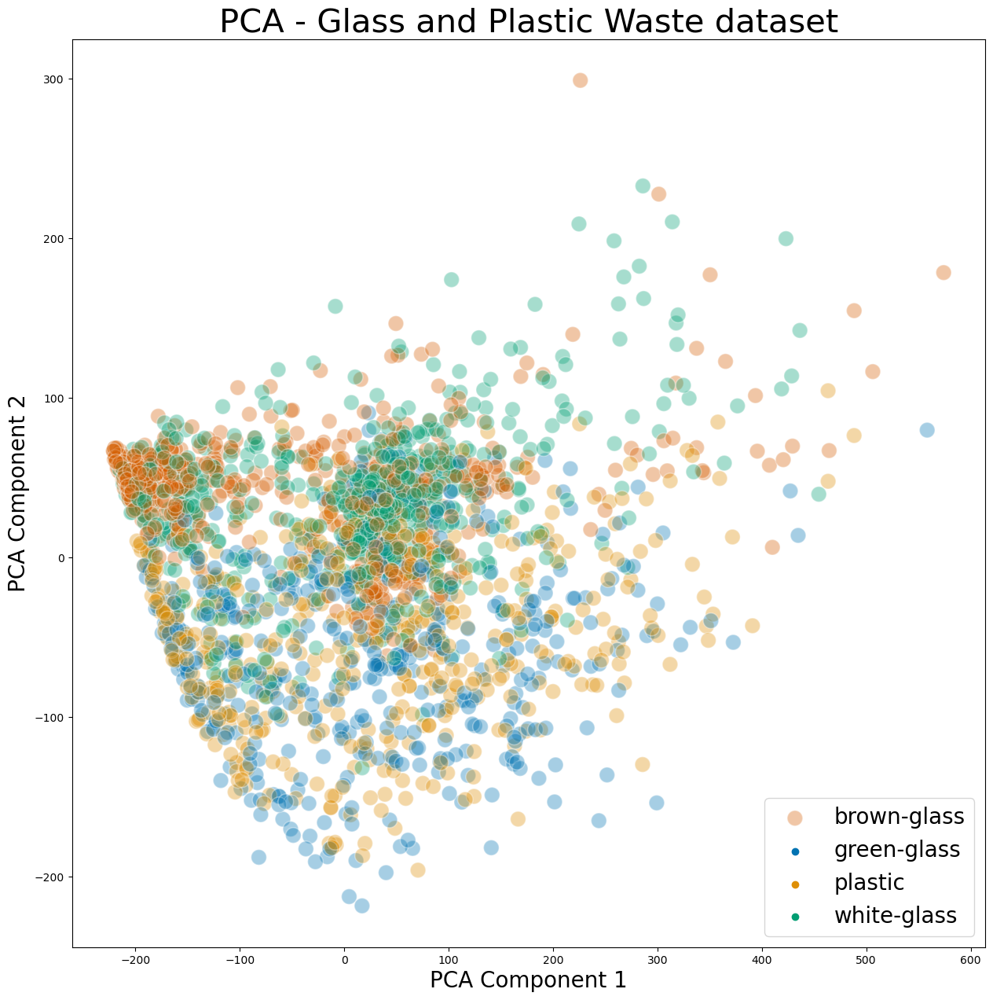

In [4]:
#plotting PCA components to visualize the data distribution in 2D

plt.figure(figsize=(15,15))
sns.scatterplot(x=X_train_2PC[:, 0], y=X_train_2PC[:, 1], 
                hue=y_train, alpha=.35,
                palette=sns.color_palette("colorblind", 4),
                s=200)
plt.legend(['brown-glass', 'green-glass', 'plastic', 'white-glass'], loc='lower right', fontsize=20)
plt.xlabel("PCA Component 1", fontsize=20)
plt.ylabel("PCA Component 2", fontsize=20)
plt.title("PCA - Glass and Plastic Waste dataset", fontsize=30)
plt.savefig("PCA - Glass and Plastic Waste dataset.png")


In [5]:
#training logistic regression model for baseline

lr = LogisticRegression(multi_class = 'multinomial', solver = 'lbfgs', max_iter = 4000)
lr.fit(X_train_scaled, y_train)

#prediction
y_pred_t = lr.predict(X_train_scaled)
y_pred = lr.predict(X_val_scaled)

#F1 and accuracy
f1_t = f1_score(y_train, y_pred_t, average = 'macro')
accuracy_t = accuracy_score(y_train, y_pred_t)
f1 = f1_score(y_val, y_pred, average = 'macro')
accuracy = accuracy_score(y_val, y_pred)

print(f'Logistic Regression | Training Accuracy: \t{accuracy_t} | Training F1 score: \t{f1_t} \n')
print(f'Logistic Regression | Validation Accuracy: \t{accuracy} | Validation F1 score: \t{f1} \n')

Logistic Regression | Training Accuracy: 	0.9995652173913043 | Training F1 score: 	0.9996177189593332 

Logistic Regression | Validation Accuracy: 	0.6979166666666666 | Validation F1 score: 	0.7144704592937778 



**Validation F1 score: 0.714**

In [6]:
#creating confusion matrix

def make_confusion_matrix(model, y_val, y_pred):
    rf_confusion = confusion_matrix(y_val, y_pred)
    plt.figure(figsize=(30, 30), dpi=120)
    ax = plt.subplot()
    sns.heatmap(rf_confusion, cmap = "Blues", annot=True, square=True, fmt="d", annot_kws={"fontsize":30})
    plt.xlabel('Predicted',fontsize = 35)
    plt.ylabel('Actual',fontsize = 35)
    ax.xaxis.set_ticklabels(['brown-glass', 'green-glass', 'plastic', 'white-glass'], fontsize=30)
    ax.yaxis.set_ticklabels(['brown-glass', 'green-glass', 'plastic', 'white-glass'], fontsize=30)
    plt.title(model+'\nCONFUSION MATRIX', fontsize = 40, loc = 'left', pad = 12)
    plt.savefig(model+'.jpg');

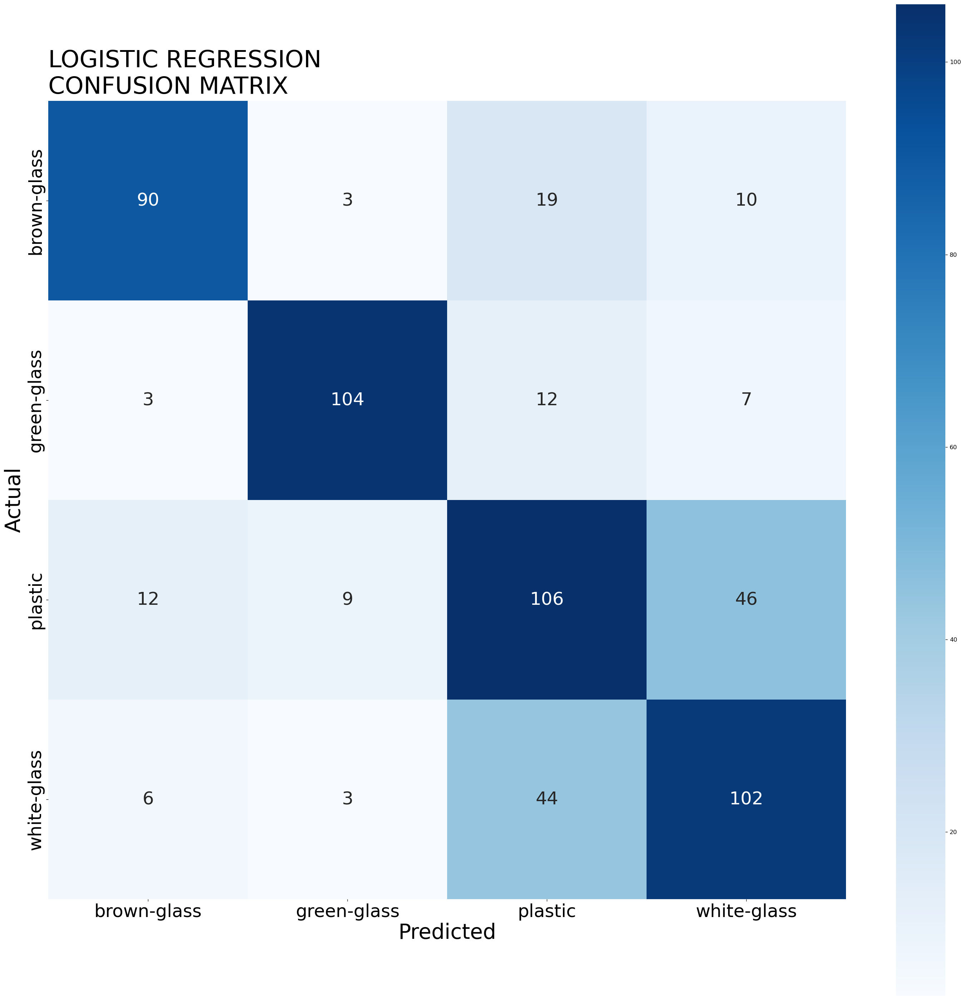

In [7]:
make_confusion_matrix("LOGISTIC REGRESSION", y_val, y_pred)

In [8]:
#showing random examples of misclassified images

def show_misclassified(y_val, y_pred):
    misclassified_indices = [i for i in range(len(y_pred)) if y_pred[i] != y_val[i]]
    misclassified_indices = np.random.choice(misclassified_indices, size=9, replace=False)
    i_li = ['brown-glass', 'green-glass', 'plastic', 'white-glass']
    
    fig = plt.figure(figsize=(10,10))
    gs = gridspec.GridSpec(3, 3)
    gs.update(wspace=0.25, hspace=0.05)
    for i, idx in enumerate(misclassified_indices[:9]):
        ax = plt.subplot(gs[i])
        i_pr = y_pred[idx]
        i_va = y_val[idx]
        i_fi = image_df.iloc[X_val.iloc[idx].name].img_id
        ax.axis("off")
        ax.set_title("PREDICTED: " + i_li[i_pr] + "   ACTUAL: " + i_li[i_va], fontsize = 8)
        plt.imshow(load_img('new_images/'+i_li[i_va]+'/'+i_fi))
    plt.show()

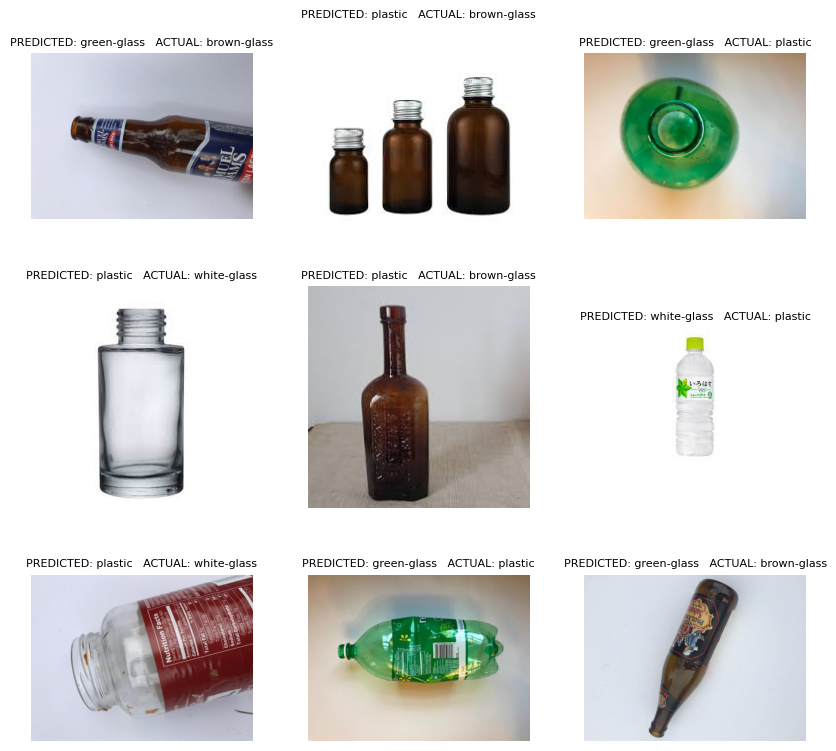

In [9]:
show_misclassified(y_val, y_pred)

### Neural Network model

In [10]:
#Precision and Recall class metrics

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

In [11]:
#data preparation

y_train_cat = to_categorical(y_train)
y_val_cat = to_categorical(y_val)
X_train_scaled.shape

(2300, 49152)

In [67]:
#running the Neural Network model

NN = Sequential()

NN.add(Dense(512,  input_dim = X_train_scaled.shape[1])) 
NN.add(Activation('relu'))

NN.add(Dense(256))
NN.add(Activation('relu'))
NN.add(Dropout(0.1)) #after many trials

NN.add(Dense(128, name = '2D_layer'))
NN.add(Activation('relu')) 
#NN.add(Dropout(0.1))

NN.add(Dense(4))
NN.add(Activation('softmax'))

NN.compile(loss='categorical_crossentropy',metrics=[f1_m])


NN_run_hist = NN.fit(X_train_scaled, y_train_cat, validation_data = (X_val_scaled, y_val_cat), epochs=50, verbose=1,callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=4, verbose=1),
    ]) 

Epoch 1/50


2023-01-26 15:59:57.700566: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 18.5364 - f1_m: 0.5148

2023-01-26 16:00:06.903646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 11s 114ms/step - loss: 18.5364 - f1_m: 0.5148 - val_loss: 10.7218 - val_f1_m: 0.5271 - lr: 0.0010
Epoch 2/50
72/72 [==============================] - 5s 70ms/step - loss: 8.1524 - f1_m: 0.5967 - val_loss: 4.5757 - val_f1_m: 0.6207 - lr: 0.0010
Epoch 3/50
72/72 [==============================] - 5s 68ms/step - loss: 5.5271 - f1_m: 0.6481 - val_loss: 4.4619 - val_f1_m: 0.6341 - lr: 0.0010
Epoch 4/50
72/72 [==============================] - 5s 68ms/step - loss: 4.5684 - f1_m: 0.6749 - val_loss: 3.3291 - val_f1_m: 0.6881 - lr: 0.0010
Epoch 5/50
72/72 [==============================] - 5s 68ms/step - loss: 3.3325 - f1_m: 0.6786 - val_loss: 2.7507 - val_f1_m: 0.6176 - lr: 0.0010
Epoch 6/50
72/72 [==============================] - 5s 66ms/step - loss: 2.4975 - f1_m: 0.6962 - val_loss: 3.3156 - val_f1_m: 0.6171 - lr: 0.0010
Epoch 7/50
72/72 [==============================] - 5s 67ms/step - loss: 1.9100 - f1_m: 0.7215 - val_loss: 2.3984 - val_f1_m: 0.696

**Validation F1 score: 0.802**

In [68]:
NN.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_19 (Dense)            (None, 512)               25166336  
                                                                 
 activation_12 (Activation)  (None, 512)               0         
                                                                 
 dense_20 (Dense)            (None, 256)               131328    
                                                                 
 activation_13 (Activation)  (None, 256)               0         
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 2D_layer (Dense)            (None, 128)               32896     
                                                                 
 activation_14 (Activation)  (None, 128)              

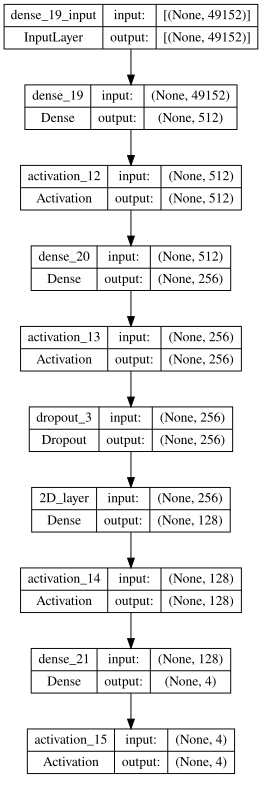

In [69]:
SVG(model_to_dot(NN, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

In [77]:
#Plot the PCA components
def plot_pca(model, X_train):
    plt.figure(figsize=(15,15))
    sns.scatterplot(x=X_train[:, 0], y=X_train[:, 1],
        hue=y_train, alpha=.35,
        palette=sns.color_palette("colorblind", 4),
        s=200
                   )
    plt.legend(['brown-glass', 'green-glass', 'plastic', 'white-glass'], loc='lower right', fontsize=20)
    plt.xlabel("PCA Component 1", fontsize=15)
    plt.ylabel("PCA Component 2", fontsize=15)
    plt.title(model+" - PCA", fontsize=25)
    plt.savefig(model+" - PCA.png")
    plt.show()

2023-01-26 16:34:00.554775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 0s 14ms/step


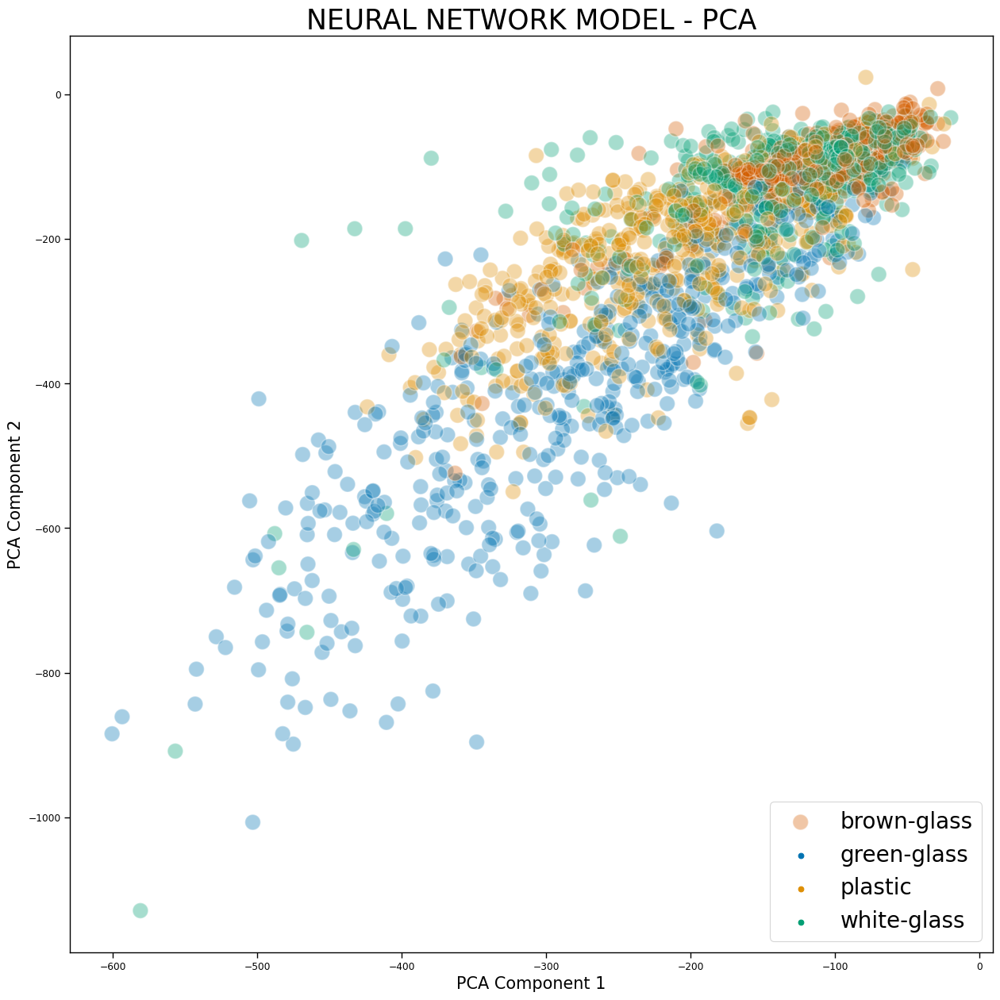

In [78]:
feature_extractor = Model(inputs=NN.input, outputs=NN.get_layer('2D_layer').output) 

X_train_NN_features_2d = feature_extractor.predict(X_train_scaled)
X_test_NN_features_2d = feature_extractor.predict(X_val_scaled)

plot_pca("NEURAL NETWORK MODEL", X_train_NN_features_2d)

In [79]:
##plotting the F1 score for the model

def plot_f1_history(model, run_hist):
    plt.figure(figsize=(15, 15))
    plt.plot(run_hist.history['f1_m'], linewidth = 4)
    plt.plot(run_hist.history['val_f1_m'], linewidth = 4)
    plt.title(model + ' - F1\n', fontsize=20)
    plt.ylabel('F1',rotation=0)
    plt.ylim(0, 1)
    plt.xlabel('epoch')
    plt.xlim(0, len(run_hist.history['f1_m']))
    plt.legend(['train', 'test'], loc='upper left', fontsize = 20)
    sns.set_context("paper", rc={"font.size":15,"axes.titlesize":30,"axes.labelsize":25})
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.grid()
    plt.show()
    plt.savefig(model+'_F1.jpg')
    final_train_f1 = run_hist.history['f1_m'][-1]
    final_val_f1 = run_hist.history['val_f1_m'][-1]
    
    print(f'Final F1 for train: {final_train_f1:.3f}')
    print(f'Final F1 for test: {final_val_f1:.3f}')

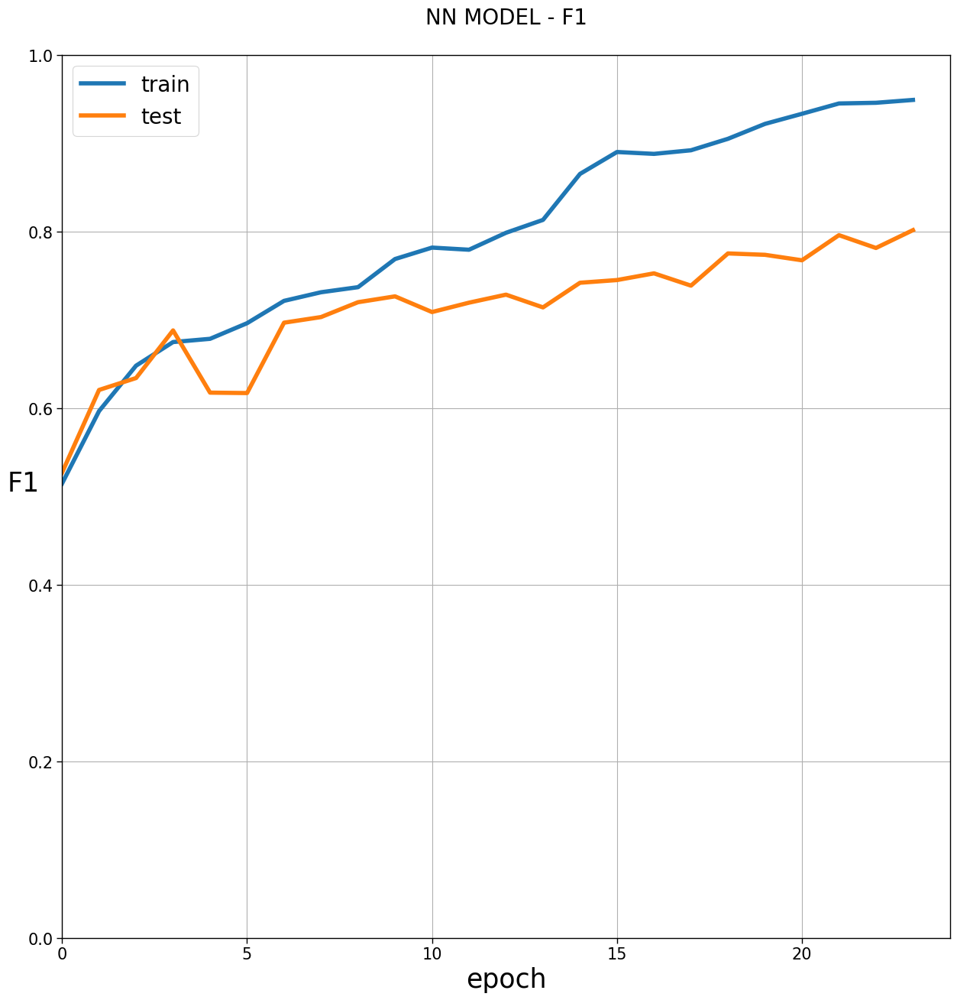

Final F1 for train: 0.949
Final F1 for test: 0.802


<Figure size 640x480 with 0 Axes>

In [80]:
plot_f1_history("NN MODEL", NN_run_hist)

18/18 [==============================] - 0s 17ms/step


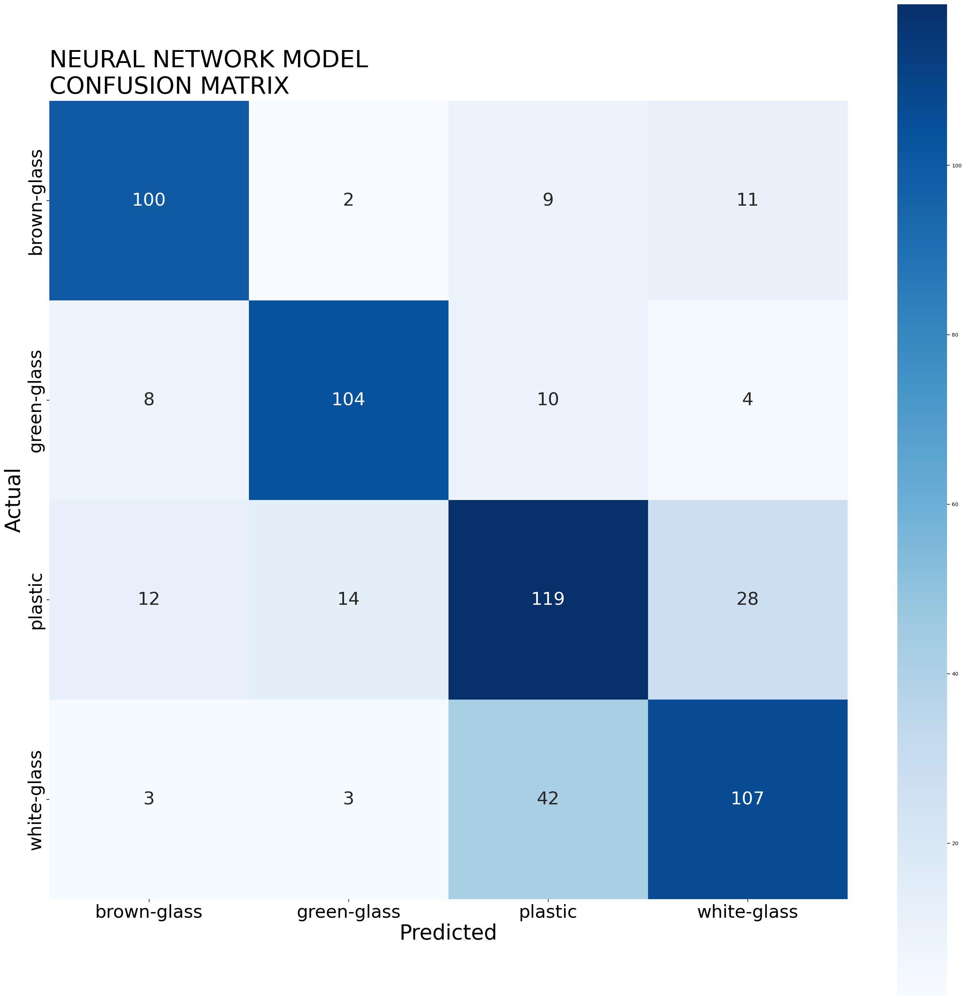

In [81]:
predictions = NN.predict(X_val_scaled)
NN_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("NEURAL NETWORK MODEL", y_val, NN_y_pred)

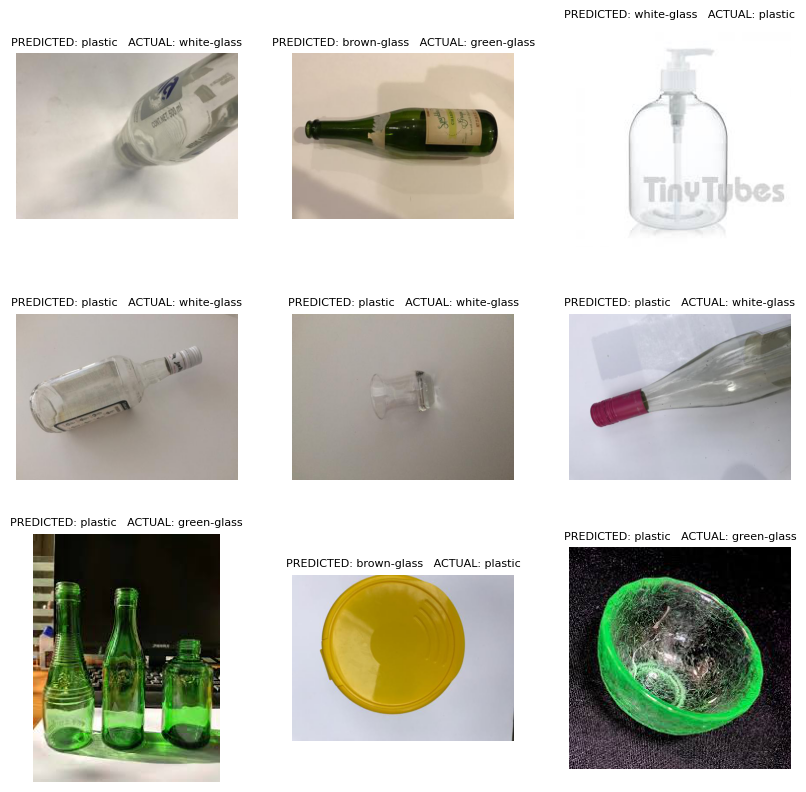

In [82]:
show_misclassified(y_val, NN_y_pred)

### CONVOLUTIONAL NEURAL NETWORK model

In [83]:
#data preparation

X_train_r = X_train.values.reshape((-1,128,128,3)) 
X_val_r = X_val.values.reshape((-1,128,128,3)) 


y_train_cat = to_categorical(y_train)
y_val_cat = to_categorical(y_val)

X_train.shape

(2300, 49152)

In [84]:
#running Convolutional Neural Network model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, GlobalAveragePooling2D, InputLayer

CNN = Sequential()

CNN.add(InputLayer(input_shape=X_train_r.shape[1:]))

# Conv block 1.  You can add more conv steps to
# each block to increase model capacity.
CNN.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding='same'))
#CNN.add(Conv2D(filters=16, kernel_size=3, activation='relu', padding='same'))
CNN.add(MaxPooling2D())

# Conv block 2 - note we increase filter dimension as we move
# further into the network. You can add more conv steps to
# each block to increase model capacity.
CNN.add(Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'))
# NN.add(Conv2D(filters=16, kernel_size=3, activation='relu', padding='same'))
CNN.add(MaxPooling2D())

# Conv block 3 - The conv blocks should be ended with either a flatten
# layer or a global pooling layer. These transform the 2D layers to 1D
# to match the following dense layers.
CNN.add(Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'))
#CNN.add(Conv2D(filters=256, kernel_size=3, activation='relu', padding='same'))

CNN.add(GlobalAveragePooling2D())

# Fully connected block - flattening followed by dense and output layers
#CNN.add(Flatten())
#CNN.add(Dense(512, activation='relu')) 
CNN.add(Dense(256, activation='relu'))
CNN.add(Dense(128, activation='relu',name = '2D_layer'))
CNN.add(Dense(4, activation='softmax'))  

CNN.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=[f1_m],
)

CNN_run_hist = CNN.fit(X_train_r, y_train_cat, validation_data = (X_val_r, y_val_cat), epochs=77, verbose=1, callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=3, verbose=1),
    ]) 

Epoch 1/77


2023-01-26 16:34:43.339329: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 1.1398 - f1_m: 0.2261

2023-01-26 16:34:51.114428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 9s 107ms/step - loss: 1.1398 - f1_m: 0.2261 - val_loss: 0.8355 - val_f1_m: 0.4628 - lr: 0.0010
Epoch 2/77
72/72 [==============================] - 6s 82ms/step - loss: 0.7263 - f1_m: 0.6077 - val_loss: 0.7288 - val_f1_m: 0.6606 - lr: 0.0010
Epoch 3/77
72/72 [==============================] - 6s 81ms/step - loss: 0.6633 - f1_m: 0.6637 - val_loss: 0.7199 - val_f1_m: 0.6190 - lr: 0.0010
Epoch 4/77
72/72 [==============================] - 6s 79ms/step - loss: 0.6356 - f1_m: 0.6831 - val_loss: 0.6852 - val_f1_m: 0.7197 - lr: 0.0010
Epoch 5/77
72/72 [==============================] - 6s 80ms/step - loss: 0.6048 - f1_m: 0.7131 - val_loss: 0.6743 - val_f1_m: 0.6840 - lr: 0.0010
Epoch 6/77
72/72 [==============================] - 6s 79ms/step - loss: 0.5885 - f1_m: 0.7273 - val_loss: 0.6238 - val_f1_m: 0.7158 - lr: 0.0010
Epoch 7/77
72/72 [==============================] - 6s 80ms/step - loss: 0.5522 - f1_m: 0.7478 - val_loss: 0.5737 - val_f1_m: 0.7306 -

Epoch 52/77
72/72 [==============================] - 6s 81ms/step - loss: 0.1960 - f1_m: 0.9256 - val_loss: 0.3245 - val_f1_m: 0.8621 - lr: 6.2500e-05
Epoch 53/77
72/72 [==============================] - 6s 79ms/step - loss: 0.1964 - f1_m: 0.9231 - val_loss: 0.3258 - val_f1_m: 0.8616 - lr: 6.2500e-05
Epoch 54/77
72/72 [==============================] - 6s 79ms/step - loss: 0.1935 - f1_m: 0.9222 - val_loss: 0.3250 - val_f1_m: 0.8654 - lr: 6.2500e-05
Epoch 55/77
72/72 [==============================] - ETA: 0s - loss: 0.1927 - f1_m: 0.9248
Epoch 55: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
72/72 [==============================] - 6s 79ms/step - loss: 0.1927 - f1_m: 0.9248 - val_loss: 0.3252 - val_f1_m: 0.8644 - lr: 6.2500e-05
Epoch 56/77
72/72 [==============================] - 6s 83ms/step - loss: 0.1882 - f1_m: 0.9257 - val_loss: 0.3237 - val_f1_m: 0.8734 - lr: 3.1250e-05
Epoch 57/77
72/72 [==============================] - 6s 81ms/step - loss: 0.1893 - f1_m: 

**Validation F1 score: 0.873**

In [85]:
CNN.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 global_average_pooling2d_1   (None, 128)             

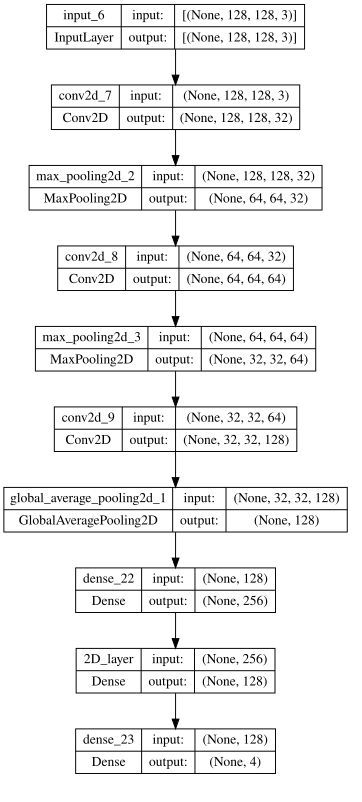

In [86]:
SVG(model_to_dot(CNN, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

2023-01-26 16:41:59.202880: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 2s 29ms/step


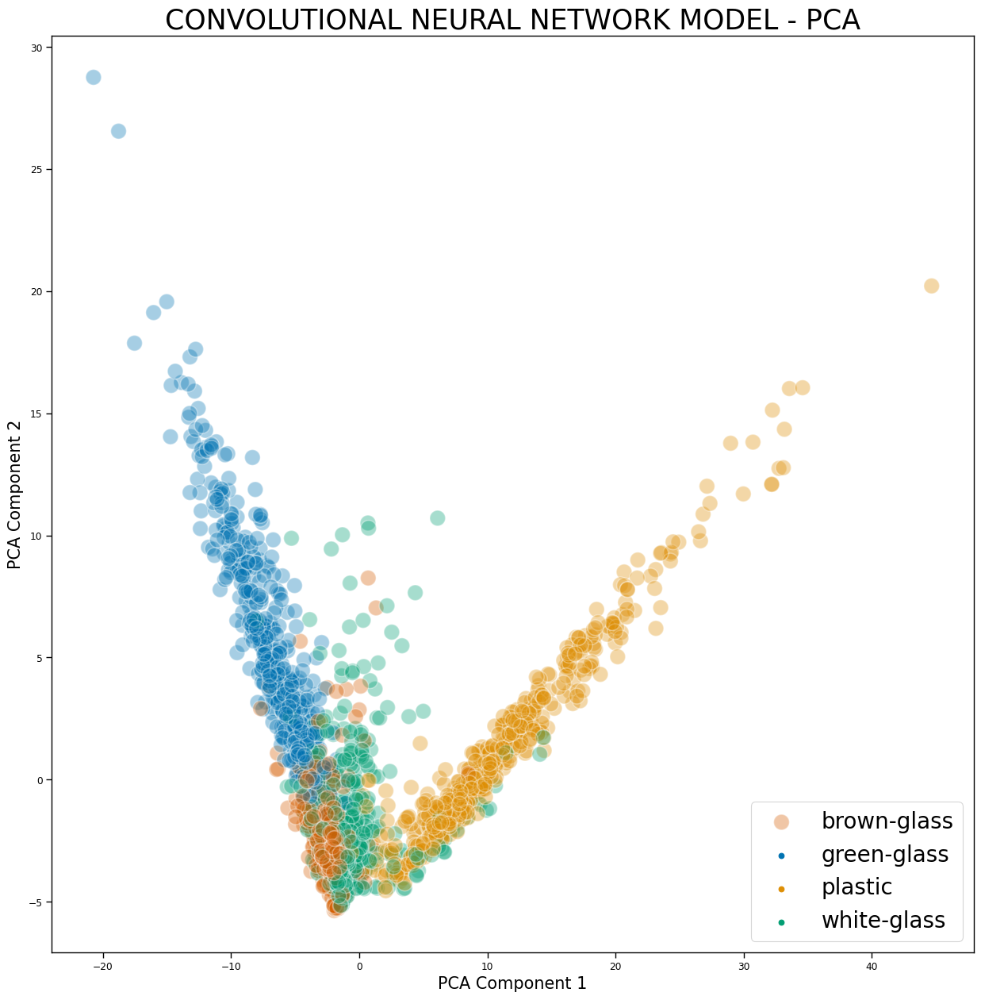

In [87]:
#Extract features from the 2D_layer

feature_extractor = Model(inputs=CNN.input, outputs=CNN.get_layer('2D_layer').output)

X_train_CNN_features_2d = feature_extractor.predict(X_train_r)

#Perform PCA on the extracted features

pca = PCA(n_components=2)
X_train_2PC_CNN = pca.fit_transform(X_train_CNN_features_2d)

plot_pca("CONVOLUTIONAL NEURAL NETWORK MODEL", X_train_2PC_CNN)

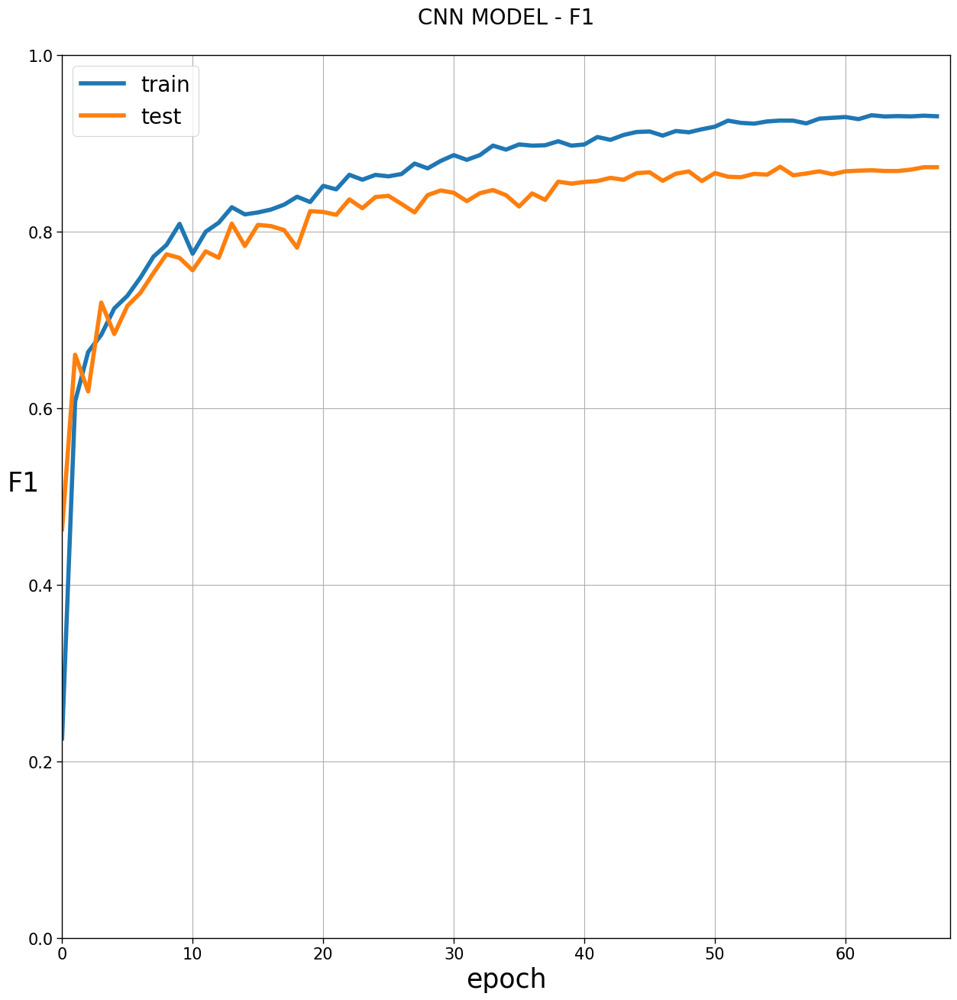

Final F1 for train: 0.931
Final F1 for test: 0.873


<Figure size 640x480 with 0 Axes>

In [88]:
plot_f1_history("CNN MODEL", CNN_run_hist)

2023-01-26 16:42:15.939167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 1s 29ms/step


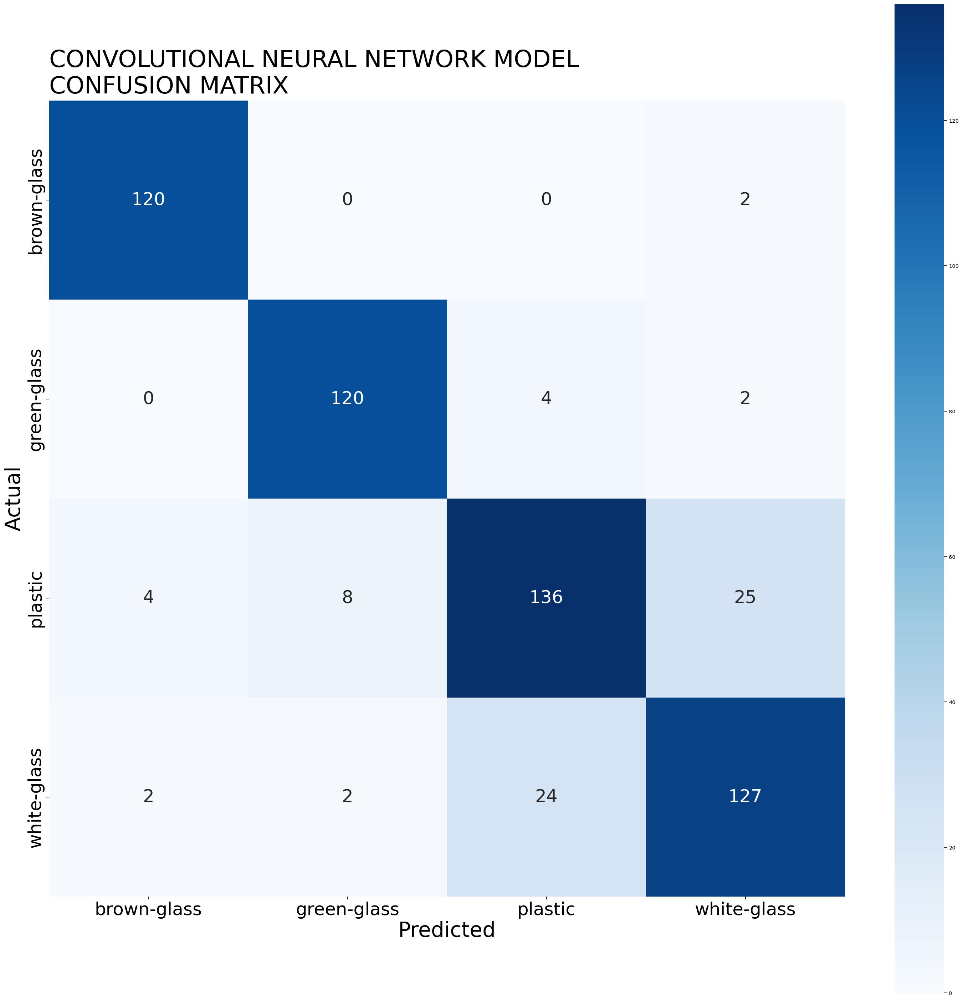

In [89]:
predictions = CNN.predict(X_val_r)
CNN_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("CONVOLUTIONAL NEURAL NETWORK MODEL", y_val, CNN_y_pred)

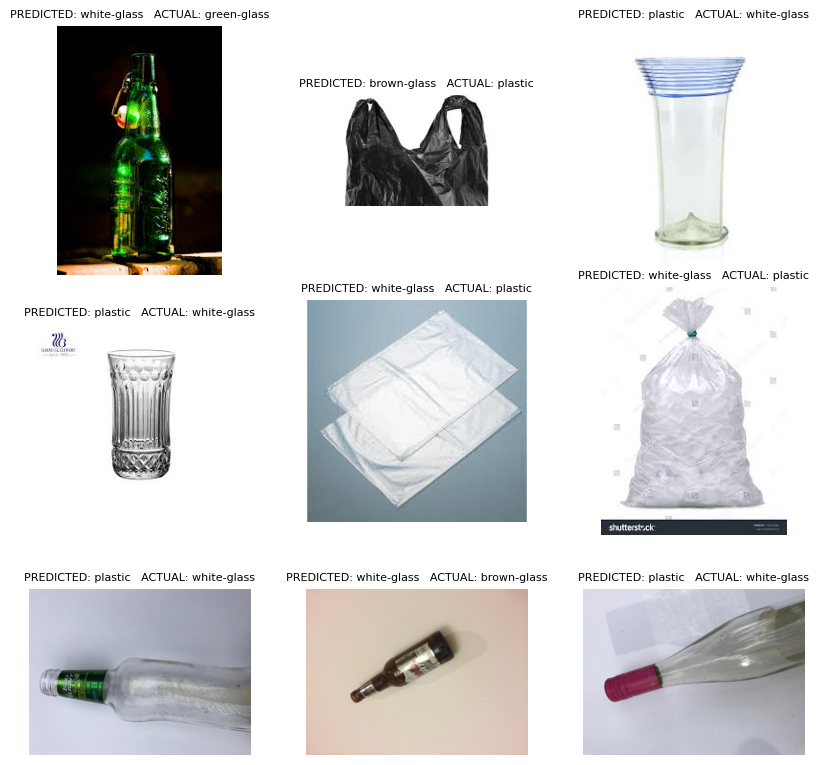

In [90]:
show_misclassified(y_val, CNN_y_pred)

### Transfer Learning Models

**VGG16**

In [94]:
# note we exclude the final dense layers by setting include_top=False,
# and add new ones to train from scratch below
VGG16_base_model = tensorflow.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=X_train_r.shape[1:]) 

#base_model = tensorflow.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=X_train.shape[1:]) 

#Freeze convolutional layers
for layer in VGG16_base_model.layers:
    layer.trainable = False    

# Establish new fully connected block
x = VGG16_base_model.output
#x = GlobalAveragePooling2D()(x) #experiment
x = Flatten()(x) # flatten from convolution tensor output 
#x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x) # number of layers and units are hyperparameters, as usual
x = Dense(256, activation='elu',name = '2D_layer')(x)

predictions = Dense(4, activation='softmax')(x) # should match # of classes predicted

# define formal model object to train and compile it as usual
VGG16 = Model(inputs=VGG16_base_model.input, outputs=predictions)
VGG16.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_m])

VGG16_run_hist = VGG16.fit(X_train_r, y_train_cat, validation_data = (X_val_r, y_val_cat), epochs=50, verbose=1, callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=4, verbose=1),
    ]) 

Epoch 1/50


2023-01-26 16:57:39.476104: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 1.1584 - f1_m: 0.6173

2023-01-26 16:57:57.346980: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 33s 308ms/step - loss: 1.1584 - f1_m: 0.6173 - val_loss: 0.6187 - val_f1_m: 0.7277 - lr: 0.0010
Epoch 2/50
72/72 [==============================] - 19s 266ms/step - loss: 0.3309 - f1_m: 0.8685 - val_loss: 0.5092 - val_f1_m: 0.8120 - lr: 0.0010
Epoch 3/50
72/72 [==============================] - 19s 263ms/step - loss: 0.1934 - f1_m: 0.9237 - val_loss: 0.4643 - val_f1_m: 0.8315 - lr: 0.0010
Epoch 4/50
72/72 [==============================] - 19s 260ms/step - loss: 0.1257 - f1_m: 0.9539 - val_loss: 0.4630 - val_f1_m: 0.8533 - lr: 0.0010
Epoch 5/50
72/72 [==============================] - 19s 269ms/step - loss: 0.1498 - f1_m: 0.9439 - val_loss: 0.4333 - val_f1_m: 0.8561 - lr: 0.0010
Epoch 6/50
72/72 [==============================] - 20s 273ms/step - loss: 0.0633 - f1_m: 0.9810 - val_loss: 0.4674 - val_f1_m: 0.8674 - lr: 0.0010
Epoch 7/50
72/72 [==============================] - 20s 272ms/step - loss: 0.0457 - f1_m: 0.9814 - val_loss: 0.5225 - val_f

**Validation F1 score: 0.879**

In [95]:
VGG16.summary()

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0  

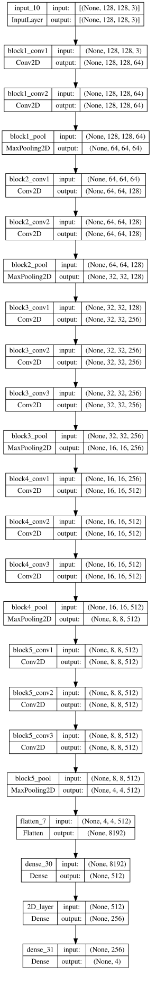

In [96]:
SVG(model_to_dot(VGG16, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

2023-01-26 17:02:17.362652: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 16s 212ms/step


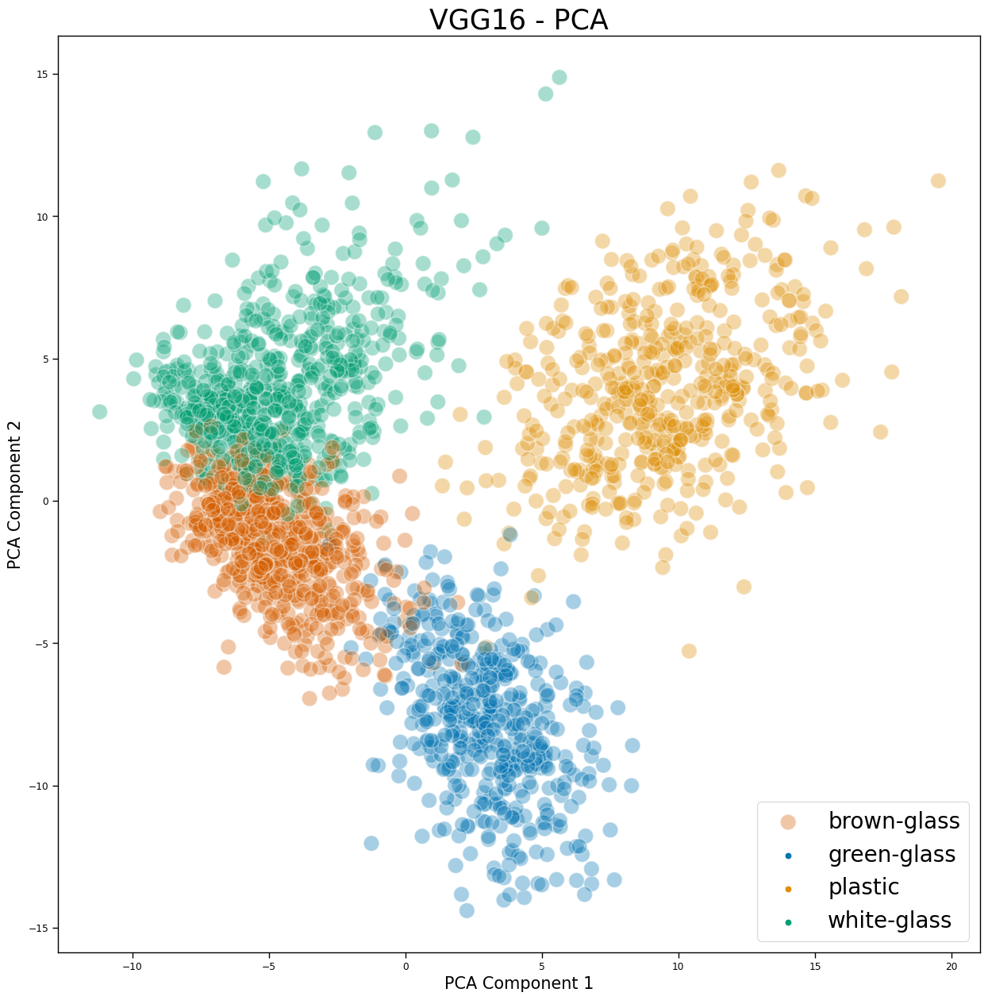

In [97]:
#Extract features from the 2D_layer

feature_extractor = Model(inputs=VGG16.input, outputs=VGG16.get_layer('2D_layer').output)

X_train_VGG16_features_2d = feature_extractor.predict(X_train_r)

#Perform PCA on the extracted features

pca = PCA(n_components=2)
X_train_2PC_VGG16 = pca.fit_transform(X_train_VGG16_features_2d)
plot_pca("VGG16", X_train_2PC_VGG16)

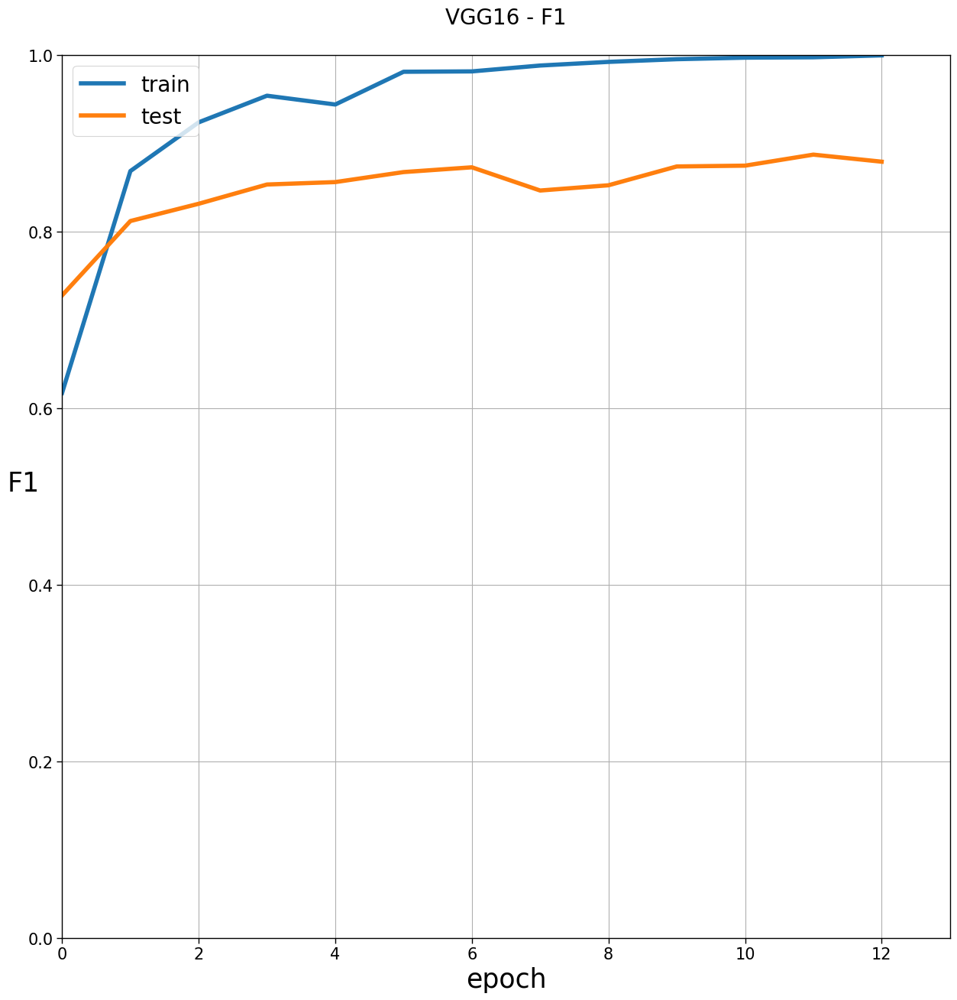

Final F1 for train: 1.000
Final F1 for test: 0.879


<Figure size 640x480 with 0 Axes>

In [98]:
plot_f1_history("VGG16", VGG16_run_hist)

2023-01-26 17:02:35.222430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 5s 243ms/step


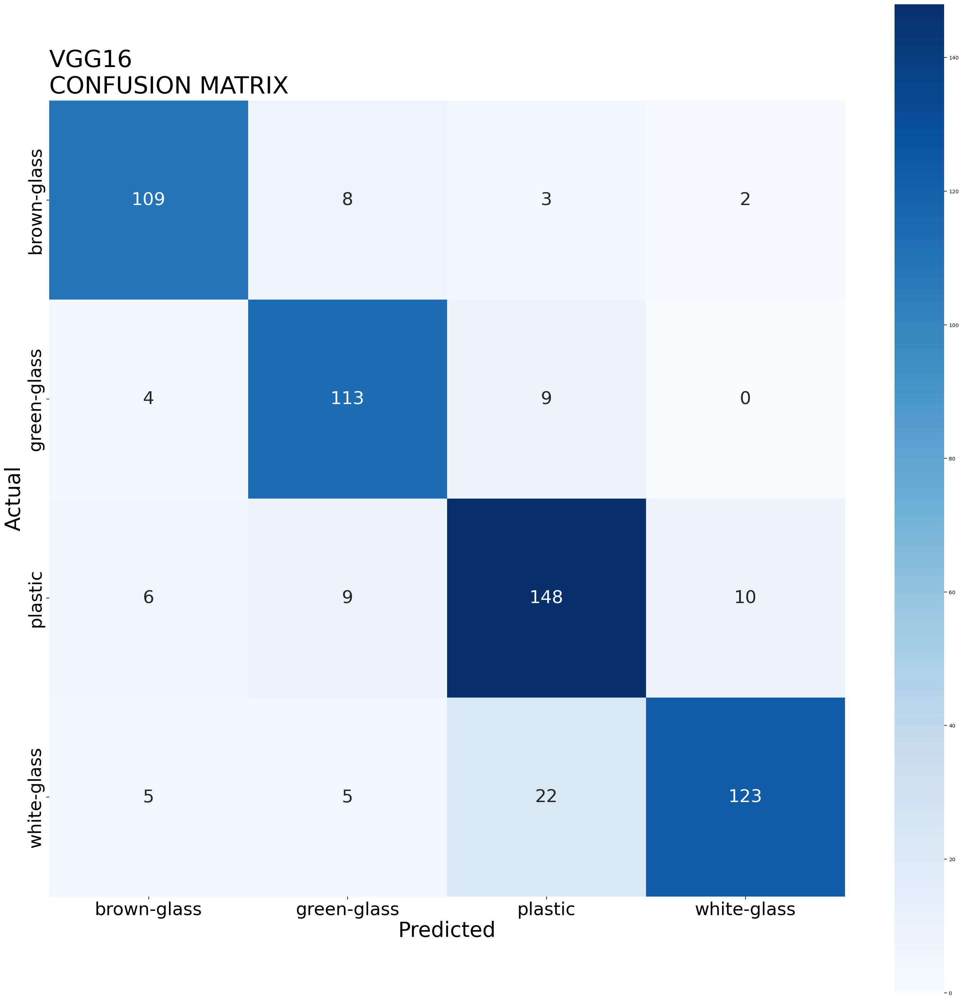

In [99]:
predictions = VGG16.predict(X_val_r)
VGG16_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("VGG16", y_val, VGG16_y_pred)

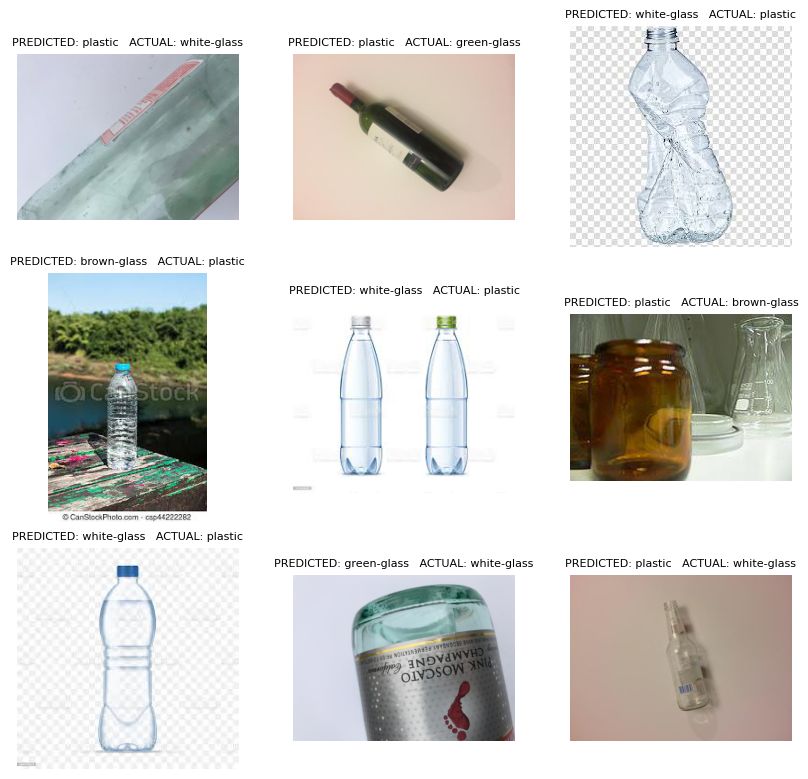

In [100]:
show_misclassified(y_val, VGG16_y_pred)

**VGG19**

In [101]:
# note we exclude the final dense layers by setting include_top=False,
# and add new ones to train from scratch below
VGG19_base_model = tensorflow.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=X_train_r.shape[1:]) 

#base_model = tensorflow.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=X_train.shape[1:]) 

# Freeze convolutional layers
for layer in VGG19_base_model.layers:
    layer.trainable = False    

# Establish new fully connected block
x = VGG19_base_model.output
#x = GlobalAveragePooling2D()(x) #experiment
x = Flatten()(x) # flatten from convolution tensor output 
#x = Dense(512, activation='relu')(x)
x = Dense(512, activation='relu')(x) # number of layers and units are hyperparameters, as usual
x = Dense(256, activation='elu',name = '2D_layer')(x)

predictions = Dense(4, activation='softmax')(x) # should match # of classes predicted

# define formal model object to train and compile it as usual
VGG19 = Model(inputs=VGG19_base_model.input, outputs=predictions)
VGG19.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_m])

VGG19_run_hist = VGG19.fit(X_train_r, y_train_cat, validation_data = (X_val_r, y_val_cat), epochs=50, verbose=1, callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=3, verbose=1),
    ]) 

Epoch 1/50


2023-01-26 17:03:22.926287: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 0.9708 - f1_m: 0.6350

2023-01-26 17:03:44.849845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 28s 368ms/step - loss: 0.9708 - f1_m: 0.6350 - val_loss: 0.6763 - val_f1_m: 0.7080 - lr: 0.0010
Epoch 2/50
72/72 [==============================] - 25s 346ms/step - loss: 0.3719 - f1_m: 0.8448 - val_loss: 0.6391 - val_f1_m: 0.7579 - lr: 0.0010
Epoch 3/50
72/72 [==============================] - 26s 358ms/step - loss: 0.2802 - f1_m: 0.8886 - val_loss: 0.8054 - val_f1_m: 0.7184 - lr: 0.0010
Epoch 4/50
72/72 [==============================] - 26s 357ms/step - loss: 0.1953 - f1_m: 0.9281 - val_loss: 0.5172 - val_f1_m: 0.8465 - lr: 0.0010
Epoch 5/50
72/72 [==============================] - 26s 365ms/step - loss: 0.1771 - f1_m: 0.9273 - val_loss: 0.5023 - val_f1_m: 0.8538 - lr: 0.0010
Epoch 6/50
72/72 [==============================] - 26s 368ms/step - loss: 0.1463 - f1_m: 0.9439 - val_loss: 0.5963 - val_f1_m: 0.8231 - lr: 0.0010
Epoch 7/50
72/72 [==============================] - 26s 365ms/step - loss: 0.0874 - f1_m: 0.9681 - val_loss: 0.6897 - val_f

**Validation F1 score: 0.860**

In [102]:
VGG19.summary()

Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0  

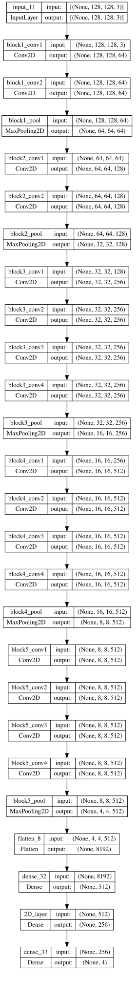

In [103]:
SVG(model_to_dot(VGG19, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

2023-01-26 17:09:48.963828: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 19s 261ms/step


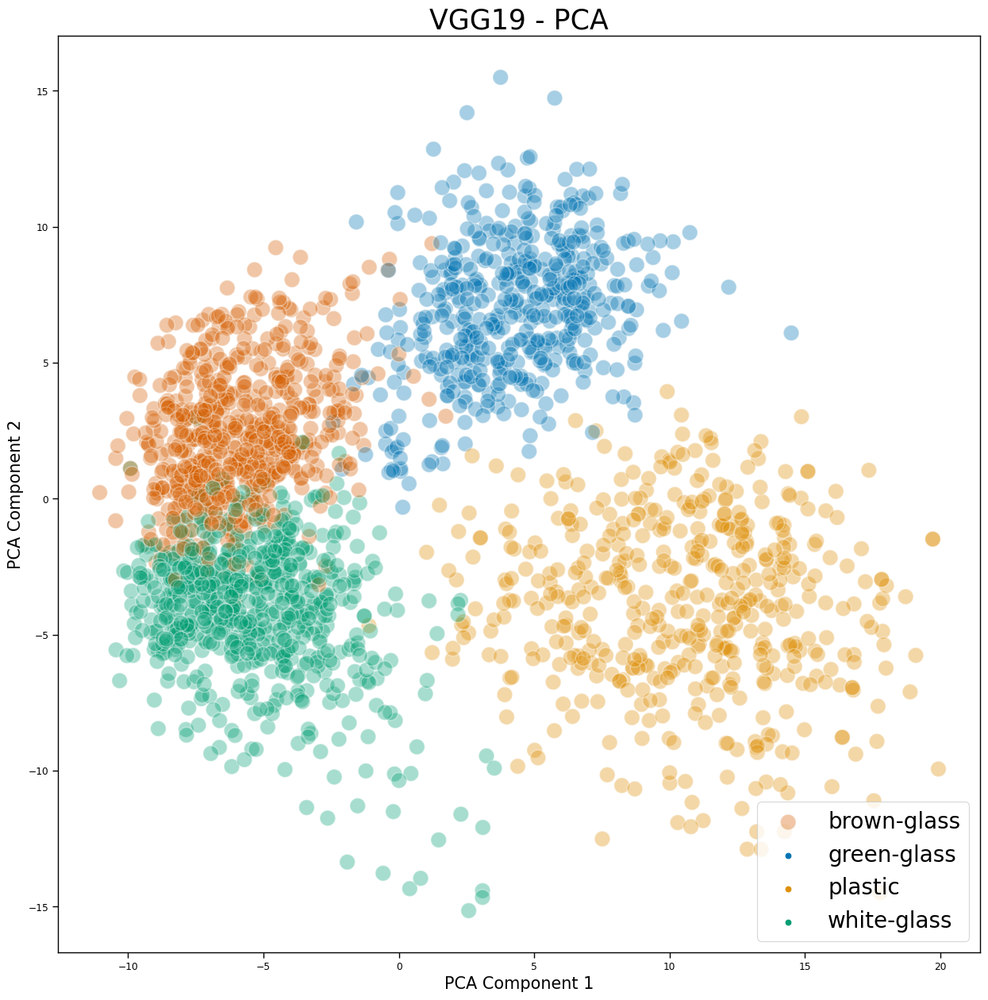

In [104]:
#Extract features from the 2D_layer

feature_extractor = Model(inputs=VGG19.input, outputs=VGG19.get_layer('2D_layer').output)

X_train_VGG19_features_2d = feature_extractor.predict(X_train_r)

#Perform PCA on the extracted features

pca = PCA(n_components=2)
X_train_2PC_VGG19 = pca.fit_transform(X_train_VGG19_features_2d)

plot_pca("VGG19", X_train_2PC_VGG19)

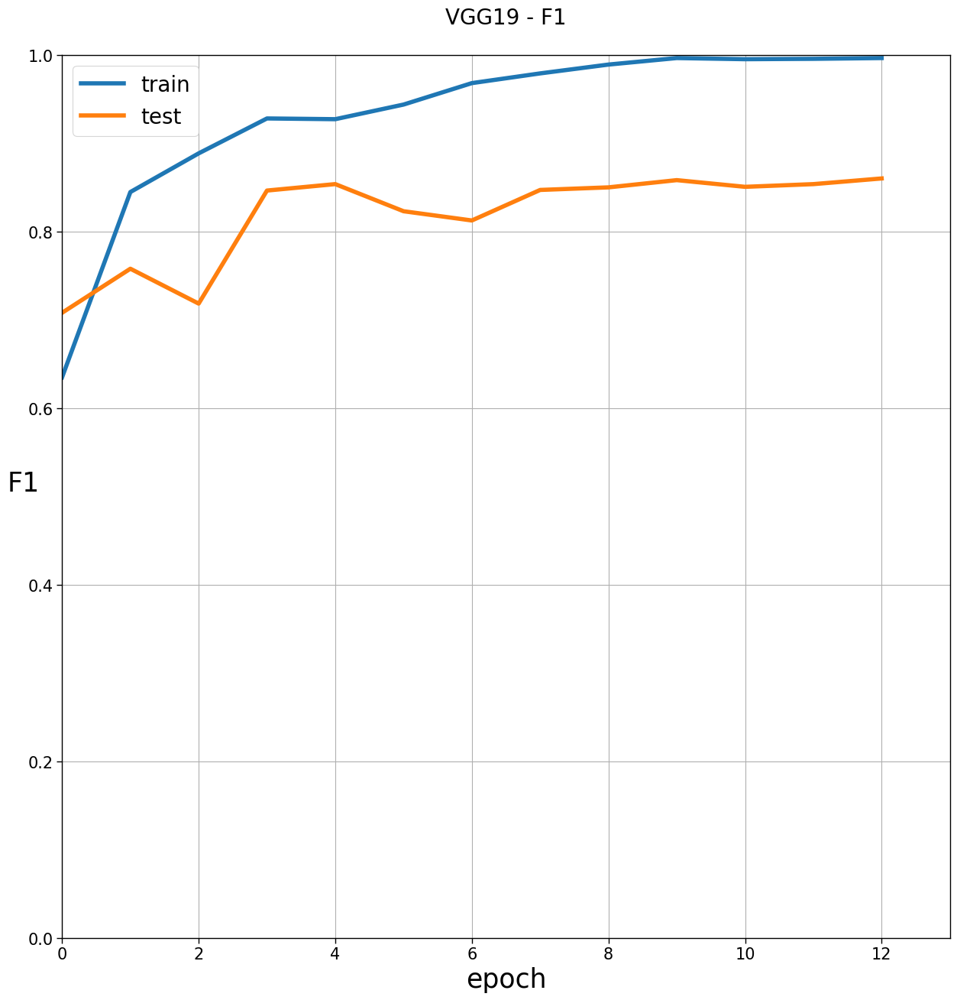

Final F1 for train: 0.997
Final F1 for test: 0.860


<Figure size 640x480 with 0 Axes>

In [105]:
plot_f1_history("VGG19", VGG19_run_hist)

2023-01-26 17:10:10.503813: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 6s 277ms/step


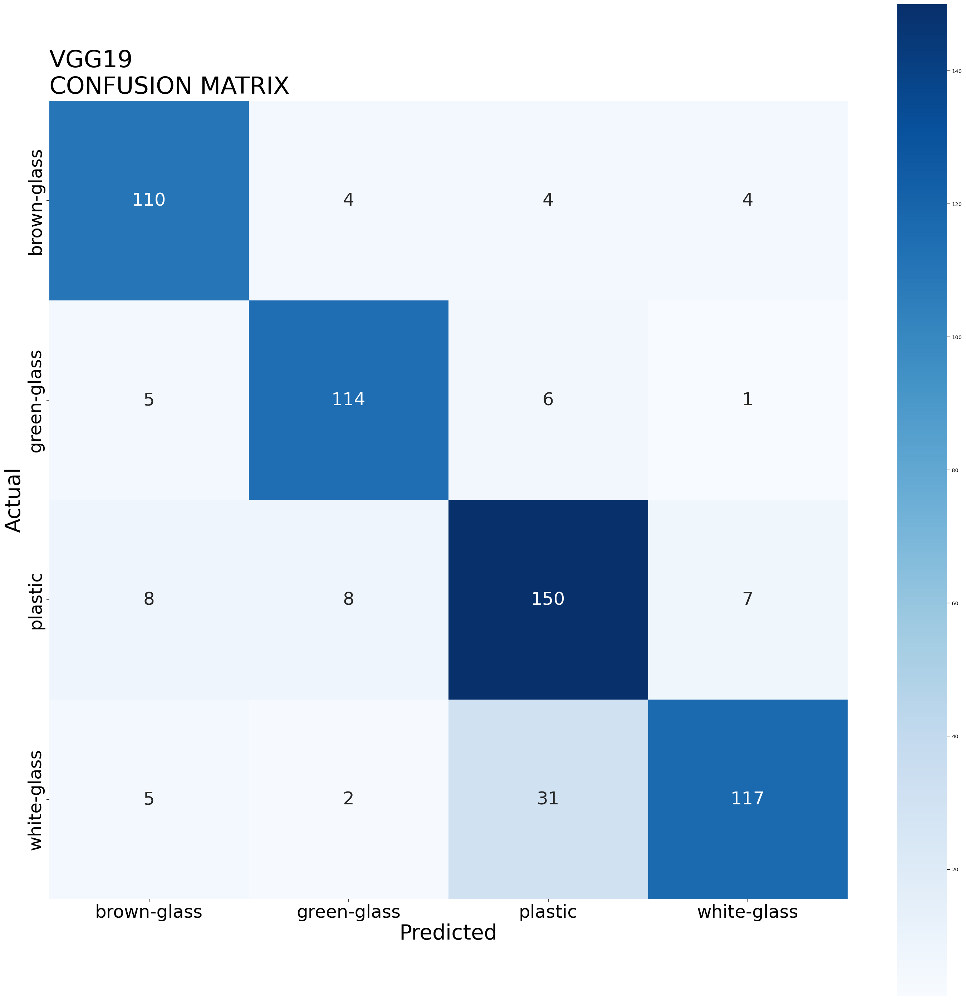

In [106]:
predictions = VGG19.predict(X_val_r)
VGG19_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("VGG19", y_val, VGG19_y_pred)

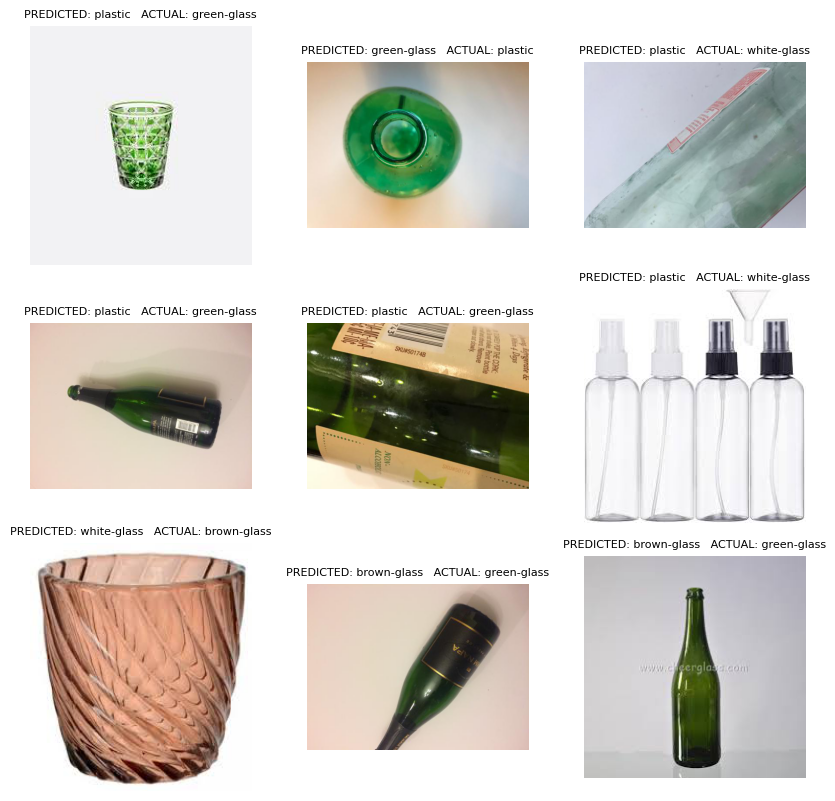

In [107]:
show_misclassified(y_val, VGG19_y_pred)

**Xception**

In [108]:
# note we exclude the final dense layers by setting include_top=False,
# and add new ones to train from scratch below

Xception_base_model = tensorflow.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=X_train_r.shape[1:]) 

# Freeze convolutional layers
for layer in Xception_base_model.layers:
    layer.trainable = False    

# Establish new fully connected block
x = Xception_base_model.output
#x = GlobalAveragePooling2D()(x) #experiment
x = Flatten()(x) # flatten from convolution tensor output 
#x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x) # number of layers and units are hyperparameters, as usual
x = Dense(256, activation='elu',name = '2D_layer')(x)

predictions = Dense(4, activation='softmax')(x) # should match # of classes predicted

# define formal model object to train and compile it as usual
Xception = Model(inputs=Xception_base_model.input, outputs=predictions)
Xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_m])

Xception_run_hist = Xception.fit(X_train_r, y_train_cat, validation_data = (X_val_r, y_val_cat), epochs=50, verbose=1, callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=4, verbose=1),
    ]) 

Epoch 1/50


2023-01-26 17:10:54.618874: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 2.4891 - f1_m: 0.6715

2023-01-26 17:11:15.886456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 30s 366ms/step - loss: 2.4891 - f1_m: 0.6715 - val_loss: 0.6310 - val_f1_m: 0.7836 - lr: 0.0010
Epoch 2/50
72/72 [==============================] - 22s 301ms/step - loss: 0.3742 - f1_m: 0.8615 - val_loss: 0.4830 - val_f1_m: 0.8312 - lr: 0.0010
Epoch 3/50
72/72 [==============================] - 19s 259ms/step - loss: 0.1721 - f1_m: 0.9391 - val_loss: 0.5071 - val_f1_m: 0.8378 - lr: 0.0010
Epoch 4/50
72/72 [==============================] - 19s 260ms/step - loss: 0.0989 - f1_m: 0.9637 - val_loss: 0.5576 - val_f1_m: 0.8289 - lr: 0.0010
Epoch 5/50
72/72 [==============================] - 19s 267ms/step - loss: 0.0958 - f1_m: 0.9650 - val_loss: 0.6833 - val_f1_m: 0.8307 - lr: 0.0010
Epoch 6/50
72/72 [==============================] - ETA: 0s - loss: 0.0716 - f1_m: 0.9741
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
72/72 [==============================] - 19s 270ms/step - loss: 0.0716 - f1_m: 0.9741 - val_loss: 0.6145 

**Validation F1 score: 0.846**

In [109]:
Xception.summary()

Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 63, 63, 32)   864         ['input_12[0][0]']               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 63, 63, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                           

 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 16, 16, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 16, 16, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)                                                                                        
                                                                                                  
 conv2d_12 (Conv2D)             (None, 8, 8, 728)    186368      ['add_13[0][0]']                 
                                                                                                  
 block4_po

                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 8, 8, 728)   2912        ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 8, 8, 728)   0           ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block7_sepconv2 (SeparableConv  (None, 8, 8, 728)   536536      ['block7_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_se

                                                                  'add_18[0][0]']                 
                                                                                                  
 block10_sepconv1_act (Activati  (None, 8, 8, 728)   0           ['add_19[0][0]']                 
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 8, 8, 728)   536536      ['block10_sepconv1_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block10_sepconv1_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block10_sepconv1[0][0]']       
 alization)                                                                                       
          

 block12_sepconv3 (SeparableCon  (None, 8, 8, 728)   536536      ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_22 (Add)                   (None, 8, 8, 728)    0           ['block12_sepconv3_bn[0][0]',    
                                                                  'add_21[0][0]']                 
                                                                                                  
 block13_sepconv1_act (Activati  (None, 8, 8, 728)   0           ['add_22[0][0]']                 
 on)      

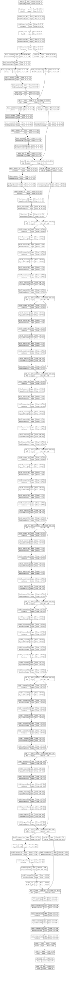

In [110]:
SVG(model_to_dot(Xception, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

2023-01-26 17:14:54.356410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 22s 190ms/step


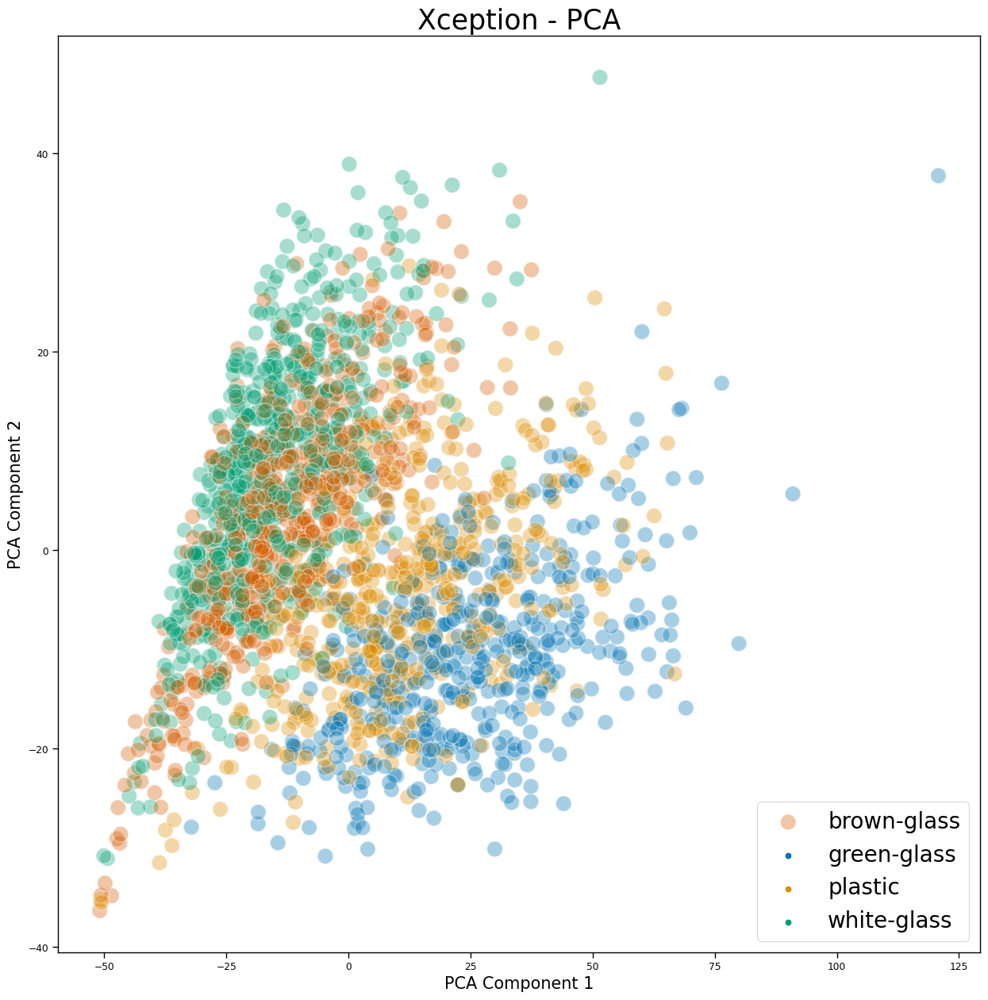

In [111]:
#Extract features from the 2D_layer

feature_extractor = Model(inputs=Xception.input, outputs=Xception.get_layer('2D_layer').output)

X_train_Xception_features_2d = feature_extractor.predict(X_train_r)

#Perform PCA on the extracted features

pca = PCA(n_components=2)
X_train_2PC_Xception = pca.fit_transform(X_train_Xception_features_2d)

plot_pca("Xception", X_train_2PC_Xception)

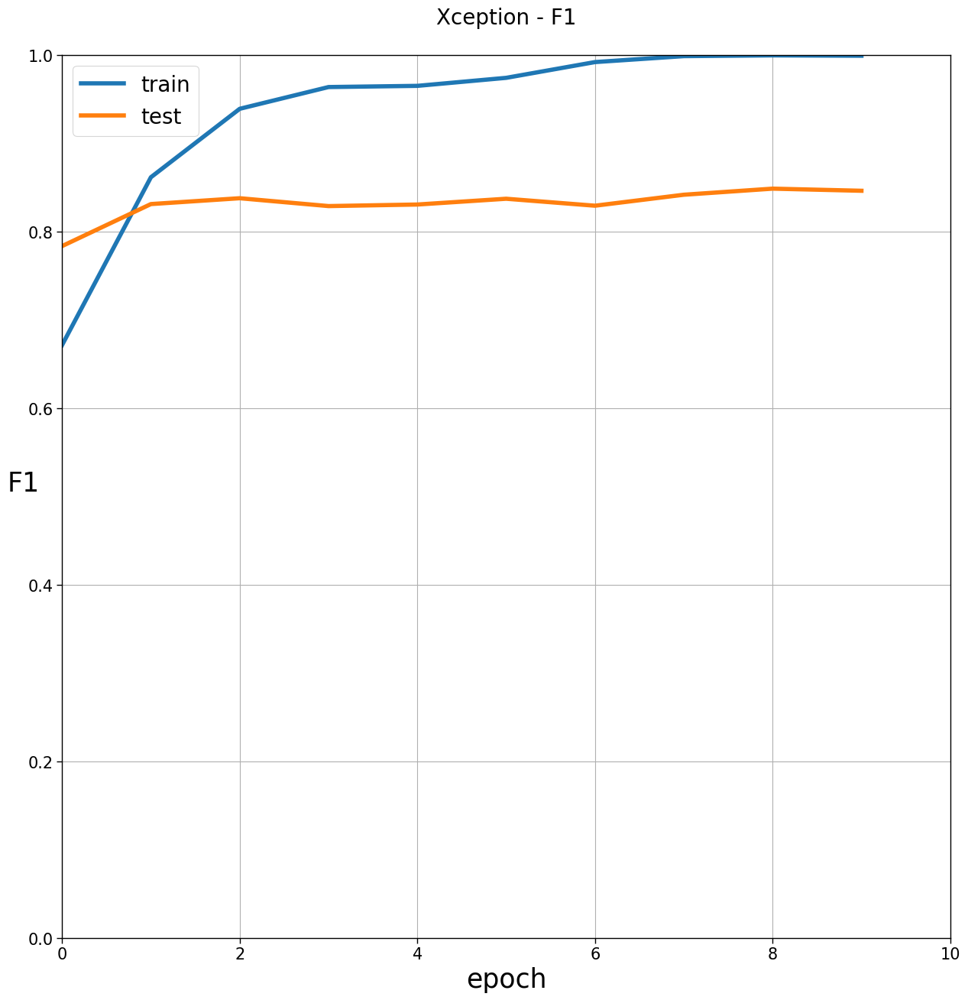

Final F1 for train: 0.999
Final F1 for test: 0.846


<Figure size 640x480 with 0 Axes>

In [112]:
plot_f1_history("Xception", Xception_run_hist)

2023-01-26 17:15:12.601127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 6s 220ms/step


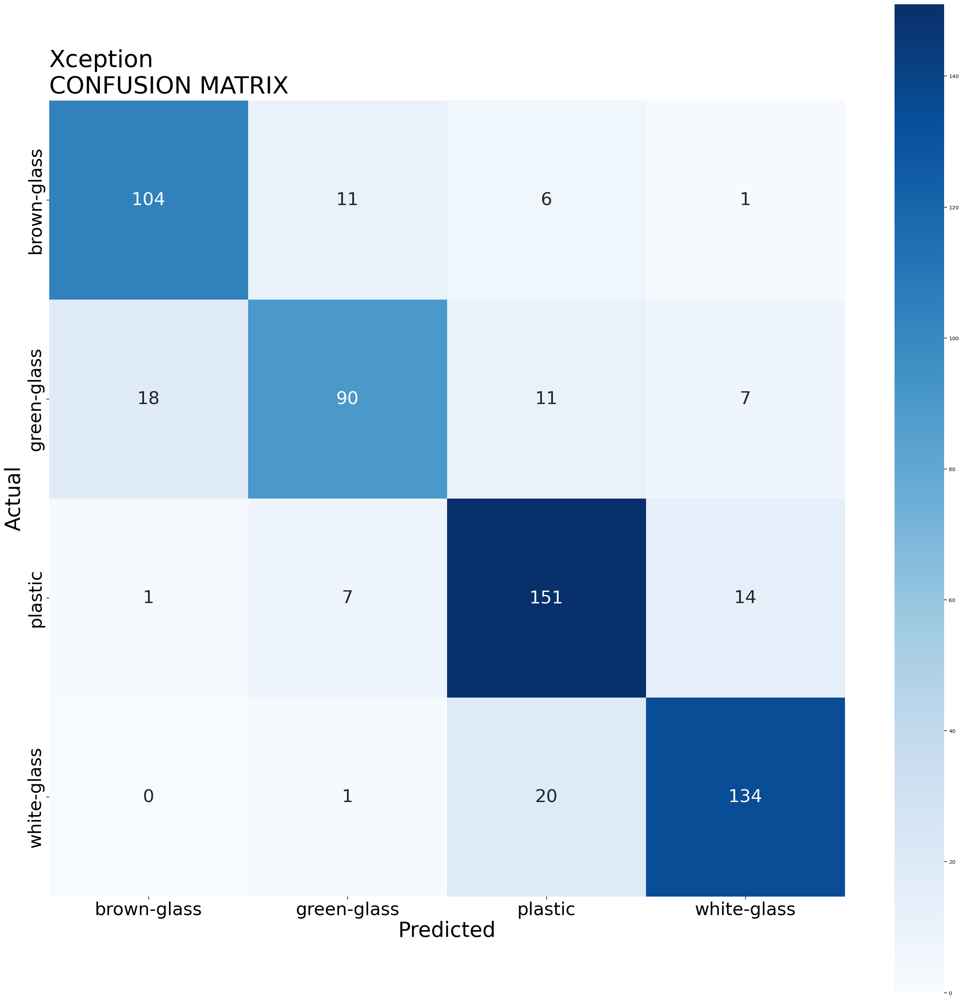

In [113]:
predictions = Xception.predict(X_val_r)
Xception_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("Xception", y_val, Xception_y_pred)

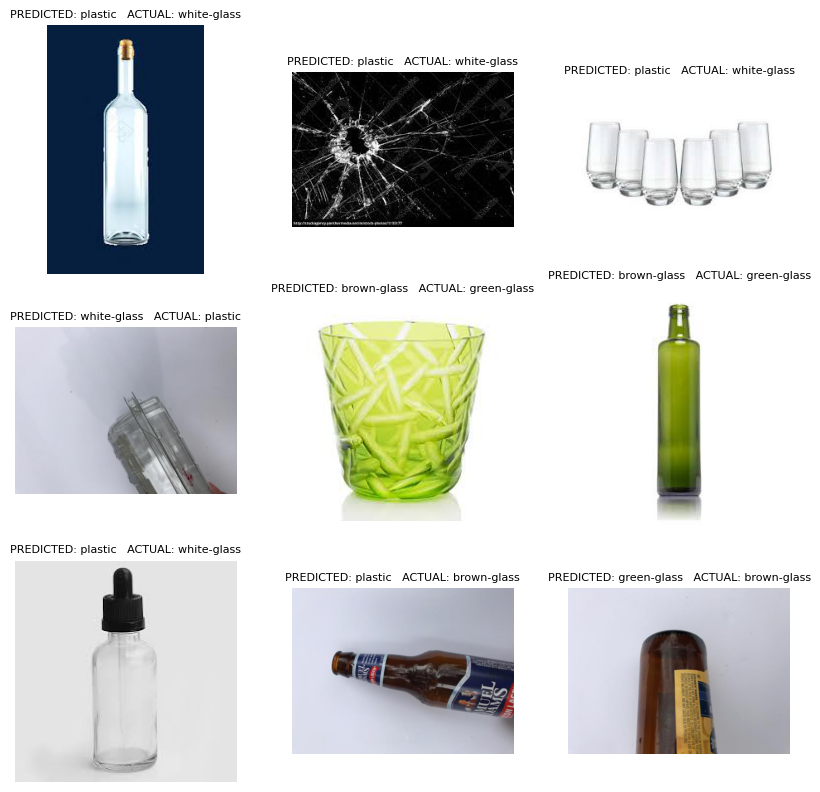

In [122]:
show_misclassified(y_val, Xception_y_pred)

**EfficientNetV2L**

In [115]:
# note we exclude the final dense layers by setting include_top=False,
# and add new ones to train from scratch below
EfficientNetV2L_base_model = tensorflow.keras.applications.EfficientNetV2L(weights='imagenet', include_top=False, input_shape=X_train_r.shape[1:]) 

# Freeze convolutional layers
for layer in EfficientNetV2L_base_model.layers:
    layer.trainable = False    

# Establish new fully connected block
x = EfficientNetV2L_base_model.output
#x = GlobalAveragePooling2D()(x) #experiment
x = Flatten()(x) # flatten from convolution tensor output 
#x = Dense(512, activation='relu')(x)
x = Dense(512, activation='relu')(x) # number of layers and units are hyperparameters, as usual
x = Dense(256, activation='elu',name = '2D_layer')(x)

predictions = Dense(4, activation='softmax')(x)

# define formal model object to train and compile it as usual
EfficientNetV2L = Model(inputs=EfficientNetV2L_base_model.input, outputs=predictions)
EfficientNetV2L.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_m])

EfficientNetV2L_run_hist = EfficientNetV2L.fit(X_train_r, y_train_cat, validation_data = (X_val_r, y_val_cat), epochs=50, verbose=1, callbacks=[
        keras.callbacks.EarlyStopping(patience=8, verbose=1, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(factor=.5, patience=4, verbose=1),
    ]) 

Epoch 1/50


2023-01-26 17:15:44.765013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - ETA: 0s - loss: 3.7196 - f1_m: 0.2267

2023-01-26 17:17:09.809802: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 132s 1s/step - loss: 3.7196 - f1_m: 0.2267 - val_loss: 3.9687 - val_f1_m: 0.3116 - lr: 0.0010
Epoch 2/50
72/72 [==============================] - 58s 806ms/step - loss: 1.6143 - f1_m: 0.2411 - val_loss: 2.5220 - val_f1_m: 0.3103 - lr: 0.0010
Epoch 3/50
72/72 [==============================] - 59s 821ms/step - loss: 1.4156 - f1_m: 0.2143 - val_loss: 1.6317 - val_f1_m: 0.3118 - lr: 0.0010
Epoch 4/50
72/72 [==============================] - 57s 790ms/step - loss: 1.2975 - f1_m: 0.2185 - val_loss: 1.3364 - val_f1_m: 0.1737 - lr: 0.0010
Epoch 5/50
72/72 [==============================] - 49s 676ms/step - loss: 1.2681 - f1_m: 0.2502 - val_loss: 2.0256 - val_f1_m: 0.3149 - lr: 0.0010
Epoch 6/50
72/72 [==============================] - 48s 673ms/step - loss: 1.2445 - f1_m: 0.2469 - val_loss: 1.3256 - val_f1_m: 0.2756 - lr: 0.0010
Epoch 7/50
72/72 [==============================] - 50s 693ms/step - loss: 1.2368 - f1_m: 0.2241 - val_loss: 1.3408 - val_f1_

**Validation F1 score: 0.279**

In [116]:
EfficientNetV2L.summary()

Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 128, 128, 3)  0           ['input_13[0][0]']               
                                                                                                  
 stem_conv (Conv2D)             (None, 64, 64, 32)   864         ['rescaling_1[0][0]']            
                                                                                                  
 stem_bn (BatchNormalization)   (None, 64, 64, 32)   128         ['stem_conv[0][0]']       

                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 32, 32, 256)  1024       ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_expand_activation (Act  (None, 32, 32, 256)  0          ['block2b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block2b_project_conv (Conv2D)  (None, 32, 32, 64)   16384       ['block2b_expand_activation[0][0]
                                                                 ']                               
                                                                                                  
 block2b_p

 block2f_project_conv (Conv2D)  (None, 32, 32, 64)   16384       ['block2f_expand_activation[0][0]
                                                                 ']                               
                                                                                                  
 block2f_project_bn (BatchNorma  (None, 32, 32, 64)  256         ['block2f_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2f_drop (Dropout)         (None, 32, 32, 64)   0           ['block2f_project_bn[0][0]']     
                                                                                                  
 block2f_add (Add)              (None, 32, 32, 64)   0           ['block2f_drop[0][0]',           
                                                                  'block2e_add[0][0]']            
          

                                                                                                  
 block3d_expand_bn (BatchNormal  (None, 16, 16, 384)  1536       ['block3d_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3d_expand_activation (Act  (None, 16, 16, 384)  0          ['block3d_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3d_project_conv (Conv2D)  (None, 16, 16, 96)   36864       ['block3d_expand_activation[0][0]
                                                                 ']                               
                                                                                                  
 block3d_p

 block4a_dwconv2 (DepthwiseConv  (None, 8, 8, 384)   3456        ['block4a_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block4a_bn (BatchNormalization  (None, 8, 8, 384)   1536        ['block4a_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block4a_activation (Activation  (None, 8, 8, 384)   0           ['block4a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4a_se_squeeze (GlobalAver  (None, 384)         0           ['block4a_activation[0][0]']     
 agePoolin

 agePooling2D)                                                                                    
                                                                                                  
 block4c_se_reshape (Reshape)   (None, 1, 1, 768)    0           ['block4c_se_squeeze[0][0]']     
                                                                                                  
 block4c_se_reduce (Conv2D)     (None, 1, 1, 48)     36912       ['block4c_se_reshape[0][0]']     
                                                                                                  
 block4c_se_expand (Conv2D)     (None, 1, 1, 768)    37632       ['block4c_se_reduce[0][0]']      
                                                                                                  
 block4c_se_excite (Multiply)   (None, 8, 8, 768)    0           ['block4c_activation[0][0]',     
                                                                  'block4c_se_expand[0][0]']      
          

                                                                                                  
 block4e_se_expand (Conv2D)     (None, 1, 1, 768)    37632       ['block4e_se_reduce[0][0]']      
                                                                                                  
 block4e_se_excite (Multiply)   (None, 8, 8, 768)    0           ['block4e_activation[0][0]',     
                                                                  'block4e_se_expand[0][0]']      
                                                                                                  
 block4e_project_conv (Conv2D)  (None, 8, 8, 192)    147456      ['block4e_se_excite[0][0]']      
                                                                                                  
 block4e_project_bn (BatchNorma  (None, 8, 8, 192)   768         ['block4e_project_conv[0][0]']   
 lization)                                                                                        
          

                                                                                                  
 block4g_project_conv (Conv2D)  (None, 8, 8, 192)    147456      ['block4g_se_excite[0][0]']      
                                                                                                  
 block4g_project_bn (BatchNorma  (None, 8, 8, 192)   768         ['block4g_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4g_drop (Dropout)         (None, 8, 8, 192)    0           ['block4g_project_bn[0][0]']     
                                                                                                  
 block4g_add (Add)              (None, 8, 8, 192)    0           ['block4g_drop[0][0]',           
                                                                  'block4f_add[0][0]']            
          

                                                                                                  
 block4i_drop (Dropout)         (None, 8, 8, 192)    0           ['block4i_project_bn[0][0]']     
                                                                                                  
 block4i_add (Add)              (None, 8, 8, 192)    0           ['block4i_drop[0][0]',           
                                                                  'block4h_add[0][0]']            
                                                                                                  
 block4j_expand_conv (Conv2D)   (None, 8, 8, 768)    147456      ['block4i_add[0][0]']            
                                                                                                  
 block4j_expand_bn (BatchNormal  (None, 8, 8, 768)   3072        ['block4j_expand_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 block5b_expand_activation (Act  (None, 8, 8, 1344)  0           ['block5b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block5b_dwconv2 (DepthwiseConv  (None, 8, 8, 1344)  12096       ['block5b_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block5b_bn (BatchNormalization  (None, 8, 8, 1344)  5376        ['block5b_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block5b_a

 2D)                                                             ']                               
                                                                                                  
 block5d_bn (BatchNormalization  (None, 8, 8, 1344)  5376        ['block5d_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block5d_activation (Activation  (None, 8, 8, 1344)  0           ['block5d_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5d_se_squeeze (GlobalAver  (None, 1344)        0           ['block5d_activation[0][0]']     
 agePooling2D)                                                                                    
          

 block5f_activation (Activation  (None, 8, 8, 1344)  0           ['block5f_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5f_se_squeeze (GlobalAver  (None, 1344)        0           ['block5f_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5f_se_reshape (Reshape)   (None, 1, 1, 1344)   0           ['block5f_se_squeeze[0][0]']     
                                                                                                  
 block5f_se_reduce (Conv2D)     (None, 1, 1, 56)     75320       ['block5f_se_reshape[0][0]']     
                                                                                                  
 block5f_s

                                                                                                  
 block5h_se_reshape (Reshape)   (None, 1, 1, 1344)   0           ['block5h_se_squeeze[0][0]']     
                                                                                                  
 block5h_se_reduce (Conv2D)     (None, 1, 1, 56)     75320       ['block5h_se_reshape[0][0]']     
                                                                                                  
 block5h_se_expand (Conv2D)     (None, 1, 1, 1344)   76608       ['block5h_se_reduce[0][0]']      
                                                                                                  
 block5h_se_excite (Multiply)   (None, 8, 8, 1344)   0           ['block5h_activation[0][0]',     
                                                                  'block5h_se_expand[0][0]']      
                                                                                                  
 block5h_p

 block5j_se_expand (Conv2D)     (None, 1, 1, 1344)   76608       ['block5j_se_reduce[0][0]']      
                                                                                                  
 block5j_se_excite (Multiply)   (None, 8, 8, 1344)   0           ['block5j_activation[0][0]',     
                                                                  'block5j_se_expand[0][0]']      
                                                                                                  
 block5j_project_conv (Conv2D)  (None, 8, 8, 224)    301056      ['block5j_se_excite[0][0]']      
                                                                                                  
 block5j_project_bn (BatchNorma  (None, 8, 8, 224)   896         ['block5j_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5j_d

 block5l_project_conv (Conv2D)  (None, 8, 8, 224)    301056      ['block5l_se_excite[0][0]']      
                                                                                                  
 block5l_project_bn (BatchNorma  (None, 8, 8, 224)   896         ['block5l_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5l_drop (Dropout)         (None, 8, 8, 224)    0           ['block5l_project_bn[0][0]']     
                                                                                                  
 block5l_add (Add)              (None, 8, 8, 224)    0           ['block5l_drop[0][0]',           
                                                                  'block5k_add[0][0]']            
                                                                                                  
 block5m_e

 block5n_drop (Dropout)         (None, 8, 8, 224)    0           ['block5n_project_bn[0][0]']     
                                                                                                  
 block5n_add (Add)              (None, 8, 8, 224)    0           ['block5n_drop[0][0]',           
                                                                  'block5m_add[0][0]']            
                                                                                                  
 block5o_expand_conv (Conv2D)   (None, 8, 8, 1344)   301056      ['block5n_add[0][0]']            
                                                                                                  
 block5o_expand_bn (BatchNormal  (None, 8, 8, 1344)  5376        ['block5o_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block5o_e

 block5q_expand_conv (Conv2D)   (None, 8, 8, 1344)   301056      ['block5p_add[0][0]']            
                                                                                                  
 block5q_expand_bn (BatchNormal  (None, 8, 8, 1344)  5376        ['block5q_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block5q_expand_activation (Act  (None, 8, 8, 1344)  0           ['block5q_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block5q_dwconv2 (DepthwiseConv  (None, 8, 8, 1344)  12096       ['block5q_expand_activation[0][0]
 2D)                                                             ']                               
          

 block5s_expand_activation (Act  (None, 8, 8, 1344)  0           ['block5s_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block5s_dwconv2 (DepthwiseConv  (None, 8, 8, 1344)  12096       ['block5s_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block5s_bn (BatchNormalization  (None, 8, 8, 1344)  5376        ['block5s_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block5s_activation (Activation  (None, 8, 8, 1344)  0           ['block5s_bn[0][0]']             
 )        

 )                                                                                                
                                                                                                  
 block6b_se_squeeze (GlobalAver  (None, 2304)        0           ['block6b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6b_se_reshape (Reshape)   (None, 1, 1, 2304)   0           ['block6b_se_squeeze[0][0]']     
                                                                                                  
 block6b_se_reduce (Conv2D)     (None, 1, 1, 96)     221280      ['block6b_se_reshape[0][0]']     
                                                                                                  
 block6b_se_expand (Conv2D)     (None, 1, 1, 2304)   223488      ['block6b_se_reduce[0][0]']      
          

 block6d_se_reshape (Reshape)   (None, 1, 1, 2304)   0           ['block6d_se_squeeze[0][0]']     
                                                                                                  
 block6d_se_reduce (Conv2D)     (None, 1, 1, 96)     221280      ['block6d_se_reshape[0][0]']     
                                                                                                  
 block6d_se_expand (Conv2D)     (None, 1, 1, 2304)   223488      ['block6d_se_reduce[0][0]']      
                                                                                                  
 block6d_se_excite (Multiply)   (None, 4, 4, 2304)   0           ['block6d_activation[0][0]',     
                                                                  'block6d_se_expand[0][0]']      
                                                                                                  
 block6d_project_conv (Conv2D)  (None, 4, 4, 384)    884736      ['block6d_se_excite[0][0]']      
          

                                                                                                  
 block6f_se_excite (Multiply)   (None, 4, 4, 2304)   0           ['block6f_activation[0][0]',     
                                                                  'block6f_se_expand[0][0]']      
                                                                                                  
 block6f_project_conv (Conv2D)  (None, 4, 4, 384)    884736      ['block6f_se_excite[0][0]']      
                                                                                                  
 block6f_project_bn (BatchNorma  (None, 4, 4, 384)   1536        ['block6f_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6f_drop (Dropout)         (None, 4, 4, 384)    0           ['block6f_project_bn[0][0]']     
          

                                                                                                  
 block6h_project_bn (BatchNorma  (None, 4, 4, 384)   1536        ['block6h_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6h_drop (Dropout)         (None, 4, 4, 384)    0           ['block6h_project_bn[0][0]']     
                                                                                                  
 block6h_add (Add)              (None, 4, 4, 384)    0           ['block6h_drop[0][0]',           
                                                                  'block6g_add[0][0]']            
                                                                                                  
 block6i_expand_conv (Conv2D)   (None, 4, 4, 2304)   884736      ['block6h_add[0][0]']            
          

                                                                                                  
 block6j_add (Add)              (None, 4, 4, 384)    0           ['block6j_drop[0][0]',           
                                                                  'block6i_add[0][0]']            
                                                                                                  
 block6k_expand_conv (Conv2D)   (None, 4, 4, 2304)   884736      ['block6j_add[0][0]']            
                                                                                                  
 block6k_expand_bn (BatchNormal  (None, 4, 4, 2304)  9216        ['block6k_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6k_expand_activation (Act  (None, 4, 4, 2304)  0           ['block6k_expand_bn[0][0]']      
 ivation) 

                                                                                                  
 block6m_expand_bn (BatchNormal  (None, 4, 4, 2304)  9216        ['block6m_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6m_expand_activation (Act  (None, 4, 4, 2304)  0           ['block6m_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6m_dwconv2 (DepthwiseConv  (None, 4, 4, 2304)  20736       ['block6m_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block6m_b

 ivation)                                                                                         
                                                                                                  
 block6o_dwconv2 (DepthwiseConv  (None, 4, 4, 2304)  20736       ['block6o_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block6o_bn (BatchNormalization  (None, 4, 4, 2304)  9216        ['block6o_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block6o_activation (Activation  (None, 4, 4, 2304)  0           ['block6o_bn[0][0]']             
 )                                                                                                
          

 block6q_bn (BatchNormalization  (None, 4, 4, 2304)  9216        ['block6q_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block6q_activation (Activation  (None, 4, 4, 2304)  0           ['block6q_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block6q_se_squeeze (GlobalAver  (None, 2304)        0           ['block6q_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6q_se_reshape (Reshape)   (None, 1, 1, 2304)   0           ['block6q_se_squeeze[0][0]']     
          

                                                                                                  
 block6s_se_squeeze (GlobalAver  (None, 2304)        0           ['block6s_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6s_se_reshape (Reshape)   (None, 1, 1, 2304)   0           ['block6s_se_squeeze[0][0]']     
                                                                                                  
 block6s_se_reduce (Conv2D)     (None, 1, 1, 96)     221280      ['block6s_se_reshape[0][0]']     
                                                                                                  
 block6s_se_expand (Conv2D)     (None, 1, 1, 2304)   223488      ['block6s_se_reduce[0][0]']      
                                                                                                  
 block6s_s

                                                                                                  
 block6u_se_reduce (Conv2D)     (None, 1, 1, 96)     221280      ['block6u_se_reshape[0][0]']     
                                                                                                  
 block6u_se_expand (Conv2D)     (None, 1, 1, 2304)   223488      ['block6u_se_reduce[0][0]']      
                                                                                                  
 block6u_se_excite (Multiply)   (None, 4, 4, 2304)   0           ['block6u_activation[0][0]',     
                                                                  'block6u_se_expand[0][0]']      
                                                                                                  
 block6u_project_conv (Conv2D)  (None, 4, 4, 384)    884736      ['block6u_se_excite[0][0]']      
                                                                                                  
 block6u_p

 block6w_se_excite (Multiply)   (None, 4, 4, 2304)   0           ['block6w_activation[0][0]',     
                                                                  'block6w_se_expand[0][0]']      
                                                                                                  
 block6w_project_conv (Conv2D)  (None, 4, 4, 384)    884736      ['block6w_se_excite[0][0]']      
                                                                                                  
 block6w_project_bn (BatchNorma  (None, 4, 4, 384)   1536        ['block6w_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6w_drop (Dropout)         (None, 4, 4, 384)    0           ['block6w_project_bn[0][0]']     
                                                                                                  
 block6w_a

 block6y_project_bn (BatchNorma  (None, 4, 4, 384)   1536        ['block6y_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6y_drop (Dropout)         (None, 4, 4, 384)    0           ['block6y_project_bn[0][0]']     
                                                                                                  
 block6y_add (Add)              (None, 4, 4, 384)    0           ['block6y_drop[0][0]',           
                                                                  'block6x_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 4, 4, 2304)   884736      ['block6y_add[0][0]']            
                                                                                                  
 block7a_e

 block7c_expand_bn (BatchNormal  (None, 4, 4, 3840)  15360       ['block7c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7c_expand_activation (Act  (None, 4, 4, 3840)  0           ['block7c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block7c_dwconv2 (DepthwiseConv  (None, 4, 4, 3840)  34560       ['block7c_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block7c_bn (BatchNormalization  (None, 4, 4, 3840)  15360       ['block7c_dwconv2[0][0]']        
 )        

                                                                                                  
 block7e_dwconv2 (DepthwiseConv  (None, 4, 4, 3840)  34560       ['block7e_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block7e_bn (BatchNormalization  (None, 4, 4, 3840)  15360       ['block7e_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block7e_activation (Activation  (None, 4, 4, 3840)  0           ['block7e_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block7e_s

 )                                                                                                
                                                                                                  
 block7g_activation (Activation  (None, 4, 4, 3840)  0           ['block7g_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block7g_se_squeeze (GlobalAver  (None, 3840)        0           ['block7g_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block7g_se_reshape (Reshape)   (None, 1, 1, 3840)   0           ['block7g_se_squeeze[0][0]']     
                                                                                                  
 block7g_s

In [117]:
SVG(model_to_dot(EfficientNetV2L, show_shapes=True, dpi=70).create(prog='dot', format='svg'))

2023-01-26 17:41:02.238277: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


72/72 [==============================] - 67s 720ms/step


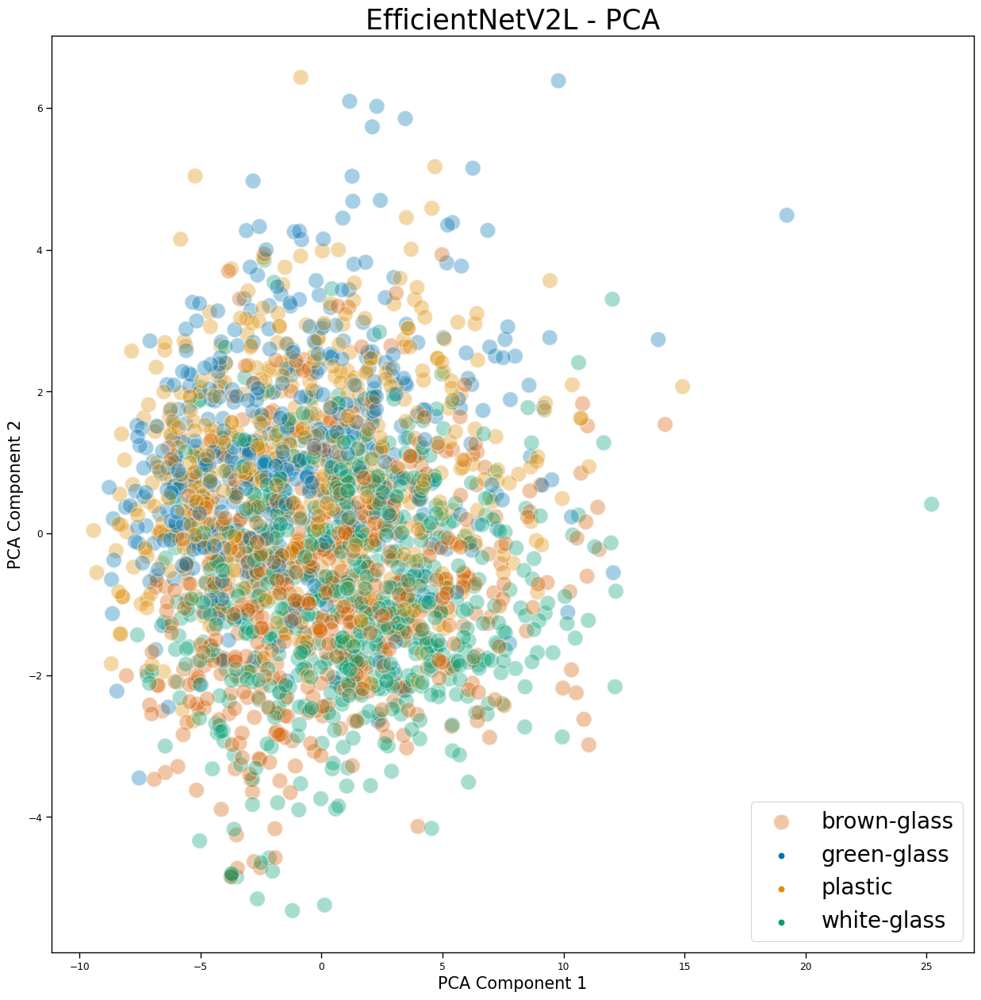

In [118]:
#Extract features from the 2D_layer

feature_extractor = Model(inputs=EfficientNetV2L.input, outputs=EfficientNetV2L.get_layer('2D_layer').output)

X_train_EfficientNetV2L_features_2d = feature_extractor.predict(X_train_r)

#Perform PCA on the extracted features

pca = PCA(n_components=2)
X_train_2PC_EfficientNetV2L = pca.fit_transform(X_train_EfficientNetV2L_features_2d)

plot_pca("EfficientNetV2L", X_train_2PC_EfficientNetV2L)

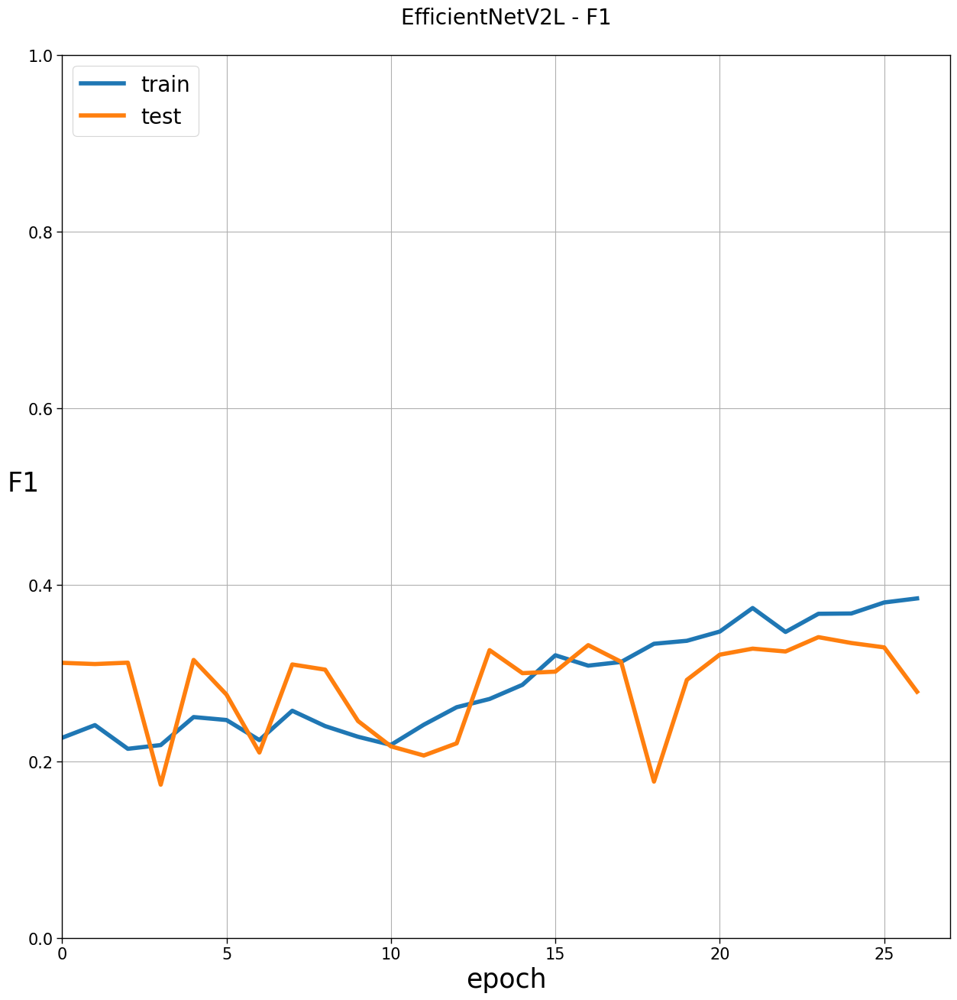

Final F1 for train: 0.385
Final F1 for test: 0.279


<Figure size 640x480 with 0 Axes>

In [119]:
plot_f1_history("EfficientNetV2L", EfficientNetV2L_run_hist)

2023-01-26 17:42:14.496725: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 36s 614ms/step


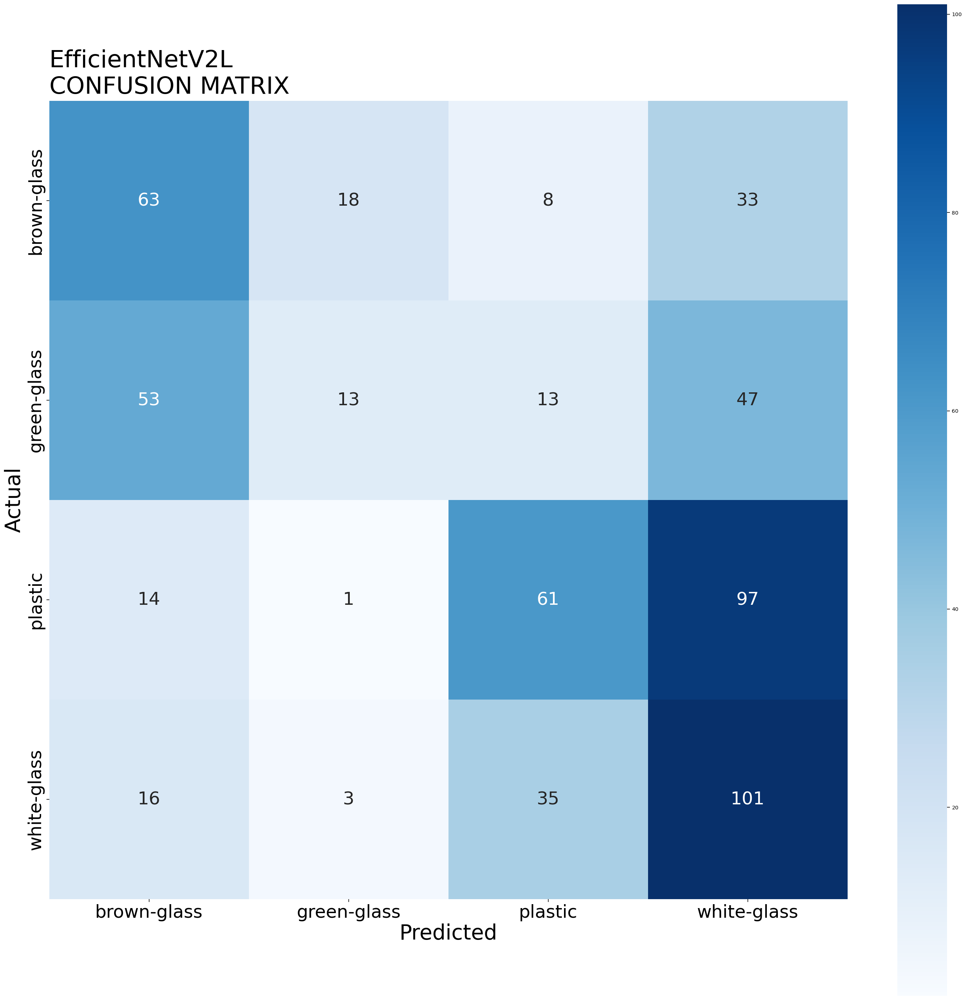

In [120]:
predictions = EfficientNetV2L.predict(X_val_r)
EfficientNetV2L_y_pred = np.argmax(predictions, axis=1)

make_confusion_matrix("EfficientNetV2L", y_val, EfficientNetV2L_y_pred)

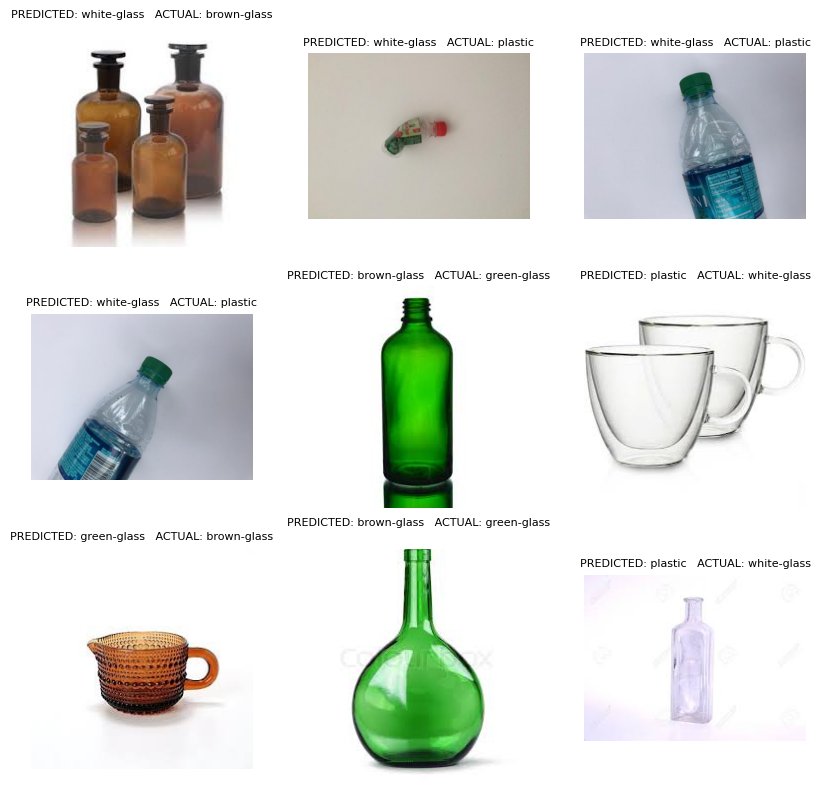

In [121]:
show_misclassified(y_val, EfficientNetV2L_y_pred)